In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/maskrcnnr101fpn_final/pytorch/default/1/model_final (8).pth
/kaggle/input/ezcarazvozes/Ezcaray - Vozes (1).pdf
/kaggle/input/uselssxyz/Padilla - 1 Nobleza virtuosa (1637).pdf


In [2]:
!pip install layoutparser torchvision && pip install "detectron2@git+https://github.com/facebookresearch/detectron2.git@v0.5#egg=detectron2"
!pip install 'git+https://github.com/facebookresearch/detectron2.git@ff53992b1985b63bd3262b5a36167098e3dada02'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 82.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.0 MB/s eta 0:00:00:

In [3]:
pip install PyMuPDF

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 83.8 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2 import model_zoo
import fitz  # PyMuPDF
import json
from scipy.spatial.distance import cdist

In [5]:
class TextlineExtractor:
    def __init__(self, model_path):
        self.cfg = self.setup_cfg(model_path)
        self.predictor = DefaultPredictor(self.cfg)
        
    def setup_cfg(self, model_path):
        cfg = get_cfg()
        cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
        cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # textline, baseline
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
        cfg.MODEL.WEIGHTS = model_path
        cfg.DATASETS.TEST = ("page_test",)
        cfg.DATALOADER.NUM_WORKERS = 2
        MetadataCatalog.get("page_test").thing_classes = ["textline", "baseline"]
        return cfg
    
    def pdf_to_images(self, pdf_path, dpi=200):
        """Convert PDF pages to images"""
        doc = fitz.open(pdf_path)
        images = []
        for page_num in range(len(doc)):
            page = doc.load_page(page_num)
            mat = fitz.Matrix(dpi/72, dpi/72)  # Scale factor for DPI
            pix = page.get_pixmap(matrix=mat)
            img_data = pix.tobytes("png")
            # Convert to OpenCV format
            nparr = np.frombuffer(img_data, np.uint8)
            img = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
            images.append(img)
        doc.close()
        return images
    
    def calculate_dynamic_padding(self, boxes, image_shape):
        """
        Calculate dynamic padding based on average distances between textboxes
        """
        if len(boxes) < 2:
            # Default padding if too few boxes
            return {"top": 10, "bottom": 10, "left": 8, "right": 8}
        
        # Calculate centers of bounding boxes
        centers = []
        for box in boxes:
            x1, y1, x2, y2 = box
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            centers.append([center_x, center_y])
        
        centers = np.array(centers)
        
        # Calculate vertical distances (between textlines)
        vertical_distances = []
        horizontal_distances = []
        
        # Sort boxes by y-coordinate to find vertical neighbors
        sorted_indices = np.argsort(centers[:, 1])
        sorted_centers = centers[sorted_indices]
        sorted_boxes = boxes[sorted_indices]
        
        # Calculate vertical gaps between consecutive textlines
        for i in range(len(sorted_boxes) - 1):
            current_box = sorted_boxes[i]
            next_box = sorted_boxes[i + 1]
            
            # Check if boxes are roughly horizontally aligned (same column)
            current_center_x = (current_box[0] + current_box[2]) / 2
            next_center_x = (next_box[0] + next_box[2]) / 2
            
            # If horizontally close (within reasonable threshold)
            if abs(current_center_x - next_center_x) < image_shape[1] * 0.3:
                # Calculate vertical gap
                gap = next_box[1] - current_box[3]  # top of next - bottom of current
                if gap > 0:  # Only positive gaps
                    vertical_distances.append(gap)
        
        # Calculate horizontal gaps (between columns)
        for i in range(len(boxes)):
            for j in range(i + 1, len(boxes)):
                box1, box2 = boxes[i], boxes[j]
                
                # Check if boxes are roughly vertically aligned (same row)
                if abs((box1[1] + box1[3])/2 - (box2[1] + box2[3])/2) < (box1[3] - box1[1]) * 0.8:
                    # Calculate horizontal gap
                    if box1[2] < box2[0]:  # box1 is to the left
                        gap = box2[0] - box1[2]
                    elif box2[2] < box1[0]:  # box2 is to the left
                        gap = box1[0] - box2[2]
                    else:
                        continue  # Overlapping boxes
                    
                    if gap > 0:
                        horizontal_distances.append(gap)
        
        # Calculate average distances
        avg_vertical_gap = np.median(vertical_distances) if vertical_distances else 20
        avg_horizontal_gap = np.median(horizontal_distances) if horizontal_distances else 15
        
        # Calculate dynamic padding (half of average gap, with limits)
        vertical_padding = max(5, min(25, avg_vertical_gap / 2))
        horizontal_padding = max(3, min(20, avg_horizontal_gap / 3))
        
        # Also consider box heights for more adaptive padding
        box_heights = [box[3] - box[1] for box in boxes]
        avg_height = np.mean(box_heights)
        
        # Scale padding based on text size
        height_factor = max(0.1, min(0.3, avg_height / 100))
        vertical_padding = max(vertical_padding, avg_height * height_factor)
        
        padding = {
            "top": int(vertical_padding * 0.95),     # Less padding on top
            "bottom": int(vertical_padding * 1.2),  # More padding on bottom
            "left": int(horizontal_padding),
            "right": int(horizontal_padding)
        }
        
        print(f"Dynamic padding calculated: {padding}")
        print(f"  - Vertical gaps found: {len(vertical_distances)}, avg: {avg_vertical_gap:.1f}")
        print(f"  - Horizontal gaps found: {len(horizontal_distances)}, avg: {avg_horizontal_gap:.1f}")
        print(f"  - Average text height: {avg_height:.1f}")
        
        return padding

    
    def filter_margin_boxes_by_area(self, boxes, scores, area_threshold_percent=12.5):
        """
        Filter out boxes that are significantly smaller than average (likely marginalia)
        """
        if len(boxes) == 0:
            return np.array([]), np.array([]), np.array([]), np.array([])
        
        # Calculate areas
        areas = []
        for box in boxes:
            x1, y1, x2, y2 = box
            area = (x2 - x1) * (y2 - y1)
            areas.append(area)
        
        areas = np.array(areas)
        avg_area = np.mean(areas)
        area_threshold = avg_area * (area_threshold_percent / 100.0)
        
        # Filter boxes
        main_boxes = []
        main_scores = []
        margin_boxes = []
        margin_scores = []
        
        for i, (box, score, area) in enumerate(zip(boxes, scores, areas)):
            if area >= area_threshold:
                main_boxes.append(box)
                main_scores.append(score)
            else:
                margin_boxes.append(box)
                margin_scores.append(score)
        
        print(f"Area filtering: avg_area={avg_area:.1f}, threshold={area_threshold:.1f}")
        print(f"Kept {len(main_boxes)} boxes, filtered {len(margin_boxes)} small boxes")
        
        return np.array(main_boxes), np.array(main_scores), np.array(margin_boxes), np.array(margin_scores)
    
    def detect_columns_and_sort_reading_order(self, boxes, scores):
        """
        Detect columns and sort textlines in proper reading order:
        LEFT to RIGHT columns, then TOP to BOTTOM within each column
        """
        if len(boxes) == 0:
            return boxes, scores, []
        
        # Calculate centers
        centers = []
        for box in boxes:
            x1, y1, x2, y2 = box
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            centers.append([center_x, center_y])
        
        centers = np.array(centers)
        
        # Method 1: Try to detect columns using K-means or gap analysis
        x_coords = centers[:, 0]  # X-coordinates of centers
        
        # Sort by x-coordinate to find potential column breaks
        sorted_x_indices = np.argsort(x_coords)
        sorted_x_coords = x_coords[sorted_x_indices]
        
        # Find significant gaps in x-coordinates that indicate column boundaries
        x_diffs = np.diff(sorted_x_coords)
        
        if len(x_diffs) == 0:
            # Single textline case
            columns = [np.array([0])]
        else:
            # Calculate threshold for column separation
            # Use median + 2*std as threshold, or minimum threshold based on image width
            median_diff = np.median(x_diffs)
            std_diff = np.std(x_diffs)
            
            # Adaptive threshold: larger of statistical threshold or percentage of image width
            image_width = np.max(x_coords) - np.min(x_coords)
            min_column_gap = image_width * 0.15  # Minimum 15% of content width for column separation
            
            threshold = max(median_diff + 2 * std_diff, min_column_gap)
            
            # Find column boundaries
            large_gaps = x_diffs > threshold
            
            # Group indices by columns
            column_boundaries = [0]  # Start of first column
            for i, is_gap in enumerate(large_gaps):
                if is_gap:
                    column_boundaries.append(i + 1)
            column_boundaries.append(len(sorted_x_indices))  # End of last column
            
            # Create column groups
            columns = []
            for i in range(len(column_boundaries) - 1):
                start_idx = column_boundaries[i]
                end_idx = column_boundaries[i + 1]
                column_indices = sorted_x_indices[start_idx:end_idx]
                columns.append(column_indices)
        
        print(f"Detected {len(columns)} columns")
        print(f"Column detection threshold: {threshold:.1f}")
        for i, col in enumerate(columns):
            x_range = [np.min(x_coords[col]), np.max(x_coords[col])]
            print(f"  Column {i}: {len(col)} textlines, X-range: [{x_range[0]:.1f}, {x_range[1]:.1f}]")
        
        # Sort columns by their leftmost x-coordinate (left to right)
        column_left_edges = []
        for column_indices in columns:
            left_edge = np.min(x_coords[column_indices])
            column_left_edges.append(left_edge)
        
        # Sort columns left to right
        column_sort_order = np.argsort(column_left_edges)
        sorted_columns = [columns[i] for i in column_sort_order]
        
        # Now process columns in left-to-right order
        sorted_boxes = []
        sorted_scores = []
        reading_order = []
        global_reading_index = 0
        
        for col_idx, column_indices in enumerate(sorted_columns):
            # Get boxes and centers for this column
            column_centers = centers[column_indices]
            
            # Sort by y-coordinate (top to bottom) within the column
            y_sort_indices = np.argsort(column_centers[:, 1])
            
            print(f"Column {col_idx} (left-to-right order): {len(column_indices)} textlines")
            
            # Add sorted boxes to result in top-to-bottom order within column
            for position_in_col, sort_idx in enumerate(y_sort_indices):
                original_idx = column_indices[sort_idx]
                sorted_boxes.append(boxes[original_idx])
                sorted_scores.append(scores[original_idx])
                
                # Record reading order information
                reading_order.append({
                    'original_index': int(original_idx),
                    'column': int(col_idx),
                    'position_in_column': int(position_in_col),
                    'reading_order_index': int(global_reading_index)
                })
                
                y_coord = column_centers[sort_idx, 1]
                print(f"  Reading order {global_reading_index}: textline {original_idx} at y={y_coord:.1f}")
                
                global_reading_index += 1
        
        print(f"Final reading order: LEFT-to-RIGHT columns, TOP-to-BOTTOM within columns")
        
        return np.array(sorted_boxes), np.array(sorted_scores), reading_order
    
    def extract_textlines(self, image):
        """Extract textline predictions from image"""
        outputs = self.predictor(image)
        instances = outputs["instances"].to("cpu")
        
        # Filter for textline class (assuming class 0 is textline)
        textline_mask = instances.pred_classes == 0
        textline_boxes = instances.pred_boxes[textline_mask].tensor.numpy()
        textline_scores = instances.scores[textline_mask].numpy()
        
        return textline_boxes, textline_scores, outputs
    
    def crop_textlines_with_dynamic_padding(self, image, boxes, use_margin_filtering=True):
        """Crop textline regions from image with dynamic padding and area filtering"""
        if len(boxes) == 0:
            return [], [], {}
        
        # Filter by area instead of/in addition to margin position
        if use_margin_filtering:
            main_boxes, main_scores, margin_boxes, margin_scores = self.filter_margin_boxes_by_area(
                boxes, np.ones(len(boxes))
            )
            
            # Calculate padding based on main text boxes only
            if len(main_boxes) > 0:
                padding = self.calculate_dynamic_padding(main_boxes, image.shape)
                boxes_for_cropping = main_boxes
            else:
                padding = self.calculate_dynamic_padding(boxes, image.shape)
                boxes_for_cropping = boxes
        else:
            padding = self.calculate_dynamic_padding(boxes, image.shape)
            boxes_for_cropping = boxes
        
        cropped_textlines = []
        padded_boxes = []
        
        for i, box in enumerate(boxes_for_cropping):
            x1, y1, x2, y2 = box.astype(int)
            
            # Apply dynamic padding
            x1_padded = max(0, x1 - padding["left"])
            y1_padded = max(0, y1 - padding["top"])
            x2_padded = min(image.shape[1], x2 + padding["right"])
            y2_padded = min(image.shape[0], y2 + padding["bottom"])
            
            cropped = image[y1_padded:y2_padded, x1_padded:x2_padded]
            cropped_textlines.append(cropped)
            padded_boxes.append([x1_padded, y1_padded, x2_padded, y2_padded])
        
        return cropped_textlines, padded_boxes, padding
    
    def save_results(self, page_num, image, boxes, scores, cropped_textlines, padded_boxes, padding_info, reading_order_info, output_dir):
        """Save page image, textline crops, and bounding box data with proper reading order"""
        page_dir = os.path.join(output_dir, f"page_{page_num:03d}")
        os.makedirs(page_dir, exist_ok=True)
        
        # Save original page
        cv2.imwrite(os.path.join(page_dir, "page.png"), image)
        
        # Save cropped textlines
        textlines_dir = os.path.join(page_dir, "textlines")
        os.makedirs(textlines_dir, exist_ok=True)
        
        bbox_data = []
        
        # Create mapping from original position to reading order
        reading_order_map = {}
        for ro_info in reading_order_info:
            reading_order_map[ro_info['original_index']] = ro_info
        
        for i, (original_box, padded_box, score, crop) in enumerate(zip(boxes, padded_boxes, scores, cropped_textlines)):
            # Get reading order info for this textline
            reading_order_data = reading_order_map.get(i, {
                'original_index': i, 
                'column': 0, 
                'position_in_column': i, 
                'reading_order_index': i
            })
            
            # Save cropped textline with reading order index in filename
            # This ensures files are naturally sorted by reading order
            reading_idx = reading_order_data['reading_order_index']
            col_idx = reading_order_data['column']
            pos_in_col = reading_order_data['position_in_column']
            
            crop_filename = f"textline_{reading_idx:03d}_col{col_idx}_pos{pos_in_col:02d}.png"
            cv2.imwrite(os.path.join(textlines_dir, crop_filename), crop)
            
            # Convert all numpy types to native Python types for JSON serialization
            original_bbox = [float(x) for x in original_box] if hasattr(original_box, '__iter__') else original_box.tolist()
            padded_bbox = [float(x) for x in padded_box] if isinstance(padded_box, (list, tuple)) else padded_box
            
            # Store bbox data
            bbox_data.append({
                "textline_id": int(i),
                "reading_order_index": reading_order_data['reading_order_index'],
                "column": reading_order_data['column'],
                "position_in_column": reading_order_data['position_in_column'],
                "original_bbox": original_bbox,
                "padded_bbox": padded_bbox,
                "score": float(score),
                "crop_filename": crop_filename
            })
        
        # Sort bbox_data by reading order for JSON output
        bbox_data.sort(key=lambda x: x['reading_order_index'])
        
        # Convert padding info to JSON serializable format
        padding_serializable = {}
        for key, value in padding_info.items():
            if isinstance(value, (np.integer, np.floating)):
                padding_serializable[key] = float(value)
            else:
                padding_serializable[key] = value
        
        # Calculate column statistics
        columns = {}
        for data in bbox_data:
            col = data['column']
            if col not in columns:
                columns[col] = []
            columns[col].append(data['reading_order_index'])
        
        # Save bbox coordinates and reading order info as JSON
        with open(os.path.join(page_dir, "bboxes.json"), 'w') as f:
            json.dump({
                "page_info": {
                    "page_number": page_num + 1,
                    "total_textlines": len(bbox_data),
                    "total_columns": len(columns)
                },
                "reading_order_summary": {
                    "description": "LEFT-to-RIGHT columns, then TOP-to-BOTTOM within each column",
                    "column_textline_counts": {f"column_{k}": len(v) for k, v in columns.items()},
                    "column_reading_ranges": {f"column_{k}": f"{min(v)}-{max(v)}" for k, v in columns.items()}
                },
                "padding_applied": padding_serializable,
                "textlines": bbox_data
            }, f, indent=2)
        
        print(f"Saved {len(bbox_data)} textlines in reading order:")
        for col_idx, reading_indices in columns.items():
            print(f"  Column {col_idx}: reading order {min(reading_indices)}-{max(reading_indices)} ({len(reading_indices)} textlines)")
        
        return bbox_data 
    
    def visualize_page(self, image, boxes, scores, padded_boxes, padding_info, reading_order_info, page_num):
        """Visualize page with original and padded bounding boxes, showing reading order"""
        fig, axes = plt.subplots(1, 3, figsize=(24, 8))
        
        # Original image with original bboxes and reading order
        img_original = image.copy()
        for i, (box, score, ro_info) in enumerate(zip(boxes, scores, reading_order_info)):
            x1, y1, x2, y2 = box.astype(int)
            
            # Color code by column
            colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]
            color = colors[ro_info['column'] % len(colors)]
            
            cv2.rectangle(img_original, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img_original, f"R{ro_info['reading_order_index']}:C{ro_info['column']}", 
                       (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        axes[0].imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f"Page {page_num + 1} - Reading Order & Columns")
        axes[0].axis('off')
        
        # Image with padded bboxes
        img_padded = image.copy()
        for i, (box, score, ro_info) in enumerate(zip(padded_boxes, scores, reading_order_info)):
            x1, y1, x2, y2 = [int(coord) for coord in box]
            
            colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]
            color = colors[ro_info['column'] % len(colors)]
            
            cv2.rectangle(img_padded, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img_padded, f"R{ro_info['reading_order_index']}", 
                       (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        axes[1].imshow(cv2.cvtColor(img_padded, cv2.COLOR_BGR2RGB))
        axes[1].set_title(f"Page {page_num + 1} - With Dynamic Padding")
        axes[1].axis('off')
        
        # Comparison view
        img_comparison = image.copy()
        for i, (orig_box, pad_box, score, ro_info) in enumerate(zip(boxes, padded_boxes, scores, reading_order_info)):
            # Original box in red
            x1, y1, x2, y2 = orig_box.astype(int)
            cv2.rectangle(img_comparison, (x1, y1), (x2, y2), (0, 0, 255), 1)
            
            # Padded box in green
            x1, y1, x2, y2 = [int(coord) for coord in pad_box]
            cv2.rectangle(img_comparison, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            cv2.putText(img_comparison, f"R{ro_info['reading_order_index']}", 
                       (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)
        
        axes[2].imshow(cv2.cvtColor(img_comparison, cv2.COLOR_BGR2RGB))
        axes[2].set_title(f"Page {page_num + 1} - Comparison (Red=Original, Green=Padded)")
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Print reading order info
        print(f"Applied padding: {padding_info}")
        columns = {}
        for ro_info in reading_order_info:
            col = ro_info['column']
            if col not in columns:
                columns[col] = []
            columns[col].append(ro_info['reading_order_index'])
        
        print(f"Reading order by columns: {dict(sorted(columns.items()))}")
        
        return len(boxes)
    
    def display_textline_samples(self, cropped_textlines, bbox_data, page_num, max_display=10):
        """Display sample cropped textlines"""
        n_textlines = min(len(cropped_textlines), max_display)
        if n_textlines == 0:
            return
            
        cols = min(5, n_textlines)
        rows = (n_textlines + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(18, 4*rows))
        
        # Handle different subplot configurations
        if rows == 1 and cols == 1:
            axes = [axes]  # Single subplot case
        elif rows == 1:
            axes = axes.reshape(1, -1)  # Single row, multiple columns
        elif cols == 1:
            axes = axes.reshape(-1, 1)  # Single column, multiple rows
        
        for i in range(n_textlines):
            row, col = i // cols, i % cols
            
            if rows == 1:
                ax = axes[0][col] if cols > 1 else axes[0]
            else:
                ax = axes[row][col] if cols > 1 else axes[row][0]
            
            textline_img = cv2.cvtColor(cropped_textlines[i], cv2.COLOR_BGR2RGB)
            ax.imshow(textline_img)
            ax.set_title(f"TL{i} (Score: {bbox_data[i]['score']:.2f})")
            ax.axis('off')
        
        # Hide unused subplots
        for i in range(n_textlines, rows * cols):
            row, col = i // cols, i % cols
            
            if rows == 1:
                ax = axes[0][col] if cols > 1 else axes[0]
            else:
                ax = axes[row][col] if cols > 1 else axes[row][0]
            ax.axis('off')
        
        plt.suptitle(f"Page {page_num + 1} - Enhanced Textline Crops with Dynamic Padding")
        plt.tight_layout()
        plt.show()

In [6]:
def process_pdf(pdf_path, model_path, output_dir="output", max_pages=200, display_pages=10):
    """Main function to process PDF with enhanced textline extraction and reading order"""
    import random
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Initialize extractor
    extractor = TextlineExtractor(model_path)
    
    # Convert PDF to images
    print(f"Converting PDF: {pdf_path}")
    images = extractor.pdf_to_images(pdf_path)
    print(f"Converted {len(images)} pages")
    
    # Select random pages for display
    total_pages = min(len(images), max_pages)
    pages_to_display = random.sample(range(total_pages), min(display_pages, total_pages))
    pages_to_display.sort()
    print(f"Will display results for {len(pages_to_display)} random pages: {[p+1 for p in pages_to_display]}")
    
    # Process each page
    total_textlines = 0
    for page_num in range(total_pages):
        print(f"\nProcessing Page {page_num + 1}...")
        
        image = images[page_num]
        
        # Extract textlines
        boxes, scores, outputs = extractor.extract_textlines(image)
        print(f"Found {len(boxes)} textlines")
        
        if len(boxes) == 0:
            print("No textlines detected, skipping...")
            continue
        
        # Filter by area and sort in reading order
        filtered_boxes, filtered_scores, _, _ = extractor.filter_margin_boxes_by_area(boxes, scores)
        
        if len(filtered_boxes) == 0:
            print("No textlines after area filtering, skipping...")
            continue
        
        # Sort in reading order
        ordered_boxes, ordered_scores, reading_order_info = extractor.detect_columns_and_sort_reading_order(
            filtered_boxes, filtered_scores
        )
        
        # Crop textlines with dynamic padding
        cropped_textlines, padded_boxes, padding_info = extractor.crop_textlines_with_dynamic_padding(
            image, ordered_boxes, use_margin_filtering=False  # Already filtered by area
        )
        
        # Save results with reading order
        bbox_data = extractor.save_results(page_num, image, ordered_boxes, ordered_scores, 
                                         cropped_textlines, padded_boxes, padding_info, 
                                         reading_order_info, output_dir)
        
        # Only visualize for selected random pages
        if page_num in pages_to_display:
            print(f"*** DISPLAYING RESULTS FOR PAGE {page_num + 1} ***")
            n_textlines = extractor.visualize_page(image, ordered_boxes, ordered_scores, padded_boxes, 
                                                 padding_info, reading_order_info, page_num)
            extractor.display_textline_samples(cropped_textlines, bbox_data, page_num)
            
            # Print bbox coordinates only for displayed pages
            print(f"Enhanced Bounding Box Results for Page {page_num + 1} (Reading Order):")
            for i, data in enumerate(bbox_data):
                orig_x1, orig_y1, orig_x2, orig_y2 = data['original_bbox']
                pad_x1, pad_y1, pad_x2, pad_y2 = data['padded_bbox']
                print(f"  Reading Order {data['reading_order_index']} (Column {data['column']}):")
                print(f"    Original: [{orig_x1:.1f}, {orig_y1:.1f}, {orig_x2:.1f}, {orig_y2:.1f}]")
                print(f"    Padded:   [{pad_x1:.1f}, {pad_y1:.1f}, {pad_x2:.1f}, {pad_y2:.1f}]")
                print(f"    Score: {data['score']:.3f}")
        
        total_textlines += len(ordered_boxes)
    
    print(f"\nProcessing complete! Total textlines extracted: {total_textlines}")
    print(f"Results saved in: {output_dir}")
    print(f"Displayed results for {len(pages_to_display)} random pages out of {total_pages} processed")

Converting PDF: /kaggle/input/ezcarazvozes/Ezcaray - Vozes (1).pdf
Converted 11 pages
Will display results for 10 random pages: [1, 2, 3, 4, 5, 7, 8, 9, 10, 11]

Processing Page 1...


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Found 23 textlines
Area filtering: avg_area=42865.3, threshold=5358.2
Kept 21 boxes, filtered 2 small boxes
Detected 3 columns
Column detection threshold: 110.7
  Column 0: 2 textlines, X-range: [530.7, 629.0]
  Column 1: 15 textlines, X-range: [827.0, 877.6]
  Column 2: 4 textlines, X-range: [1028.5, 1048.3]
Column 0 (left-to-right order): 2 textlines
  Reading order 0: textline 11 at y=1285.0
  Reading order 1: textline 10 at y=1958.6
Column 1 (left-to-right order): 15 textlines
  Reading order 2: textline 0 at y=135.8
  Reading order 3: textline 20 at y=355.4
  Reading order 4: textline 4 at y=783.9
  Reading order 5: textline 2 at y=867.8
  Reading order 6: textline 12 at y=949.2
  Reading order 7: textline 3 at y=1033.9
  Reading order 8: textline 8 at y=1118.1
  Reading order 9: textline 18 at y=1201.8
  Reading order 10: textline 19 at y=1368.6
  Reading order 11: textline 6 at y=1453.1
  Reading order 12: textline 7 at y=1536.8
  Reading order 13: textline 15 at y=1619.5
  Read

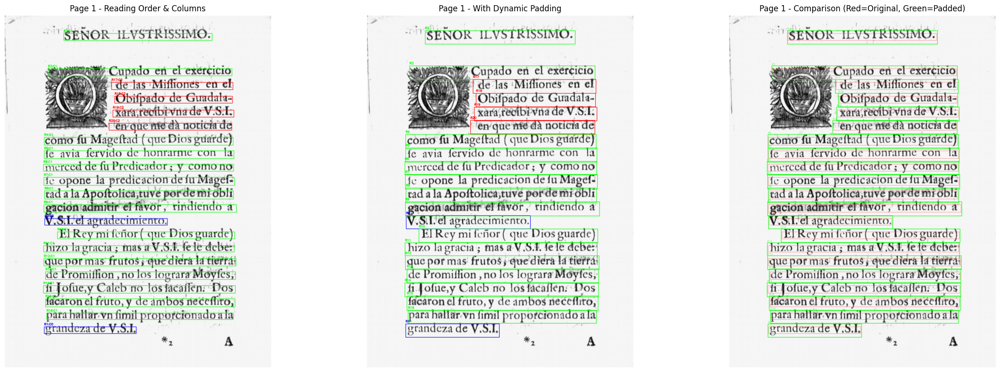

Applied padding: {'top': 18, 'bottom': 23, 'left': 5, 'right': 5}
Reading order by columns: {0: [0, 1], 1: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], 2: [17, 18, 19, 20]}


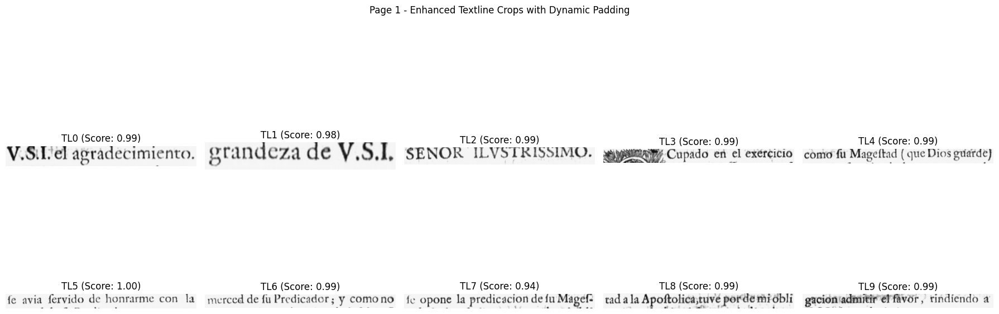

Enhanced Bounding Box Results for Page 1 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [241.4, 1433.6, 1424.7, 1472.7]
    Padded:   [236.0, 1415.0, 1429.0, 1495.0]
    Score: 0.993
  Reading Order 1 (Column 0):
    Original: [327.6, 1347.1, 1427.6, 1390.2]
    Padded:   [322.0, 1329.0, 1432.0, 1413.0]
    Score: 0.984
  Reading Order 2 (Column 1):
    Original: [248.4, 1264.8, 1009.5, 1305.2]
    Padded:   [243.0, 1246.0, 1014.0, 1328.0]
    Score: 0.991
  Reading Order 3 (Column 1):
    Original: [647.9, 672.3, 1409.1, 715.8]
    Padded:   [642.0, 654.0, 1414.0, 738.0]
    Score: 0.988
  Reading Order 4 (Column 1):
    Original: [245.3, 759.4, 1417.9, 808.3]
    Padded:   [240.0, 741.0, 1422.0, 831.0]
    Score: 0.994
  Reading Order 5 (Column 1):
    Original: [366.2, 114.1, 1287.8, 157.5]
    Padded:   [361.0, 96.0, 1292.0, 180.0]
    Score: 0.996
  Reading Order 6 (Column 1):
    Original: [243.2, 1513.6, 1435.7, 1560.0]
    Padded:   [238.0, 1495.0, 1440.0, 1582.0]

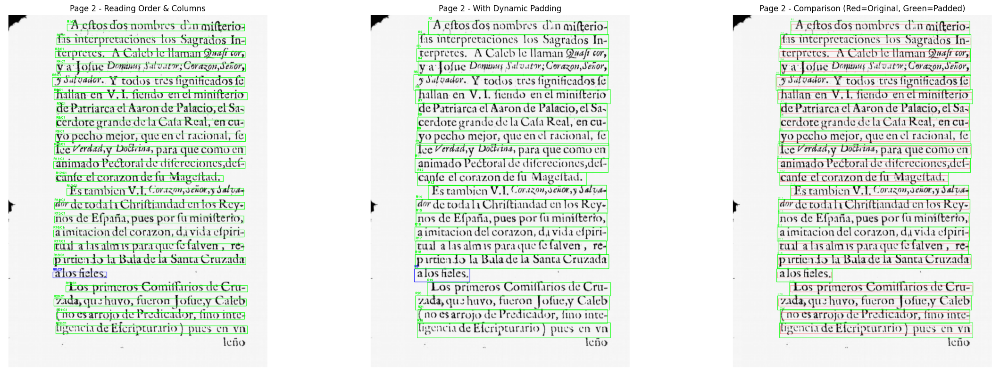

Applied padding: {'top': 19, 'bottom': 25, 'left': 5, 'right': 5}
Reading order by columns: {0: [0], 1: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}


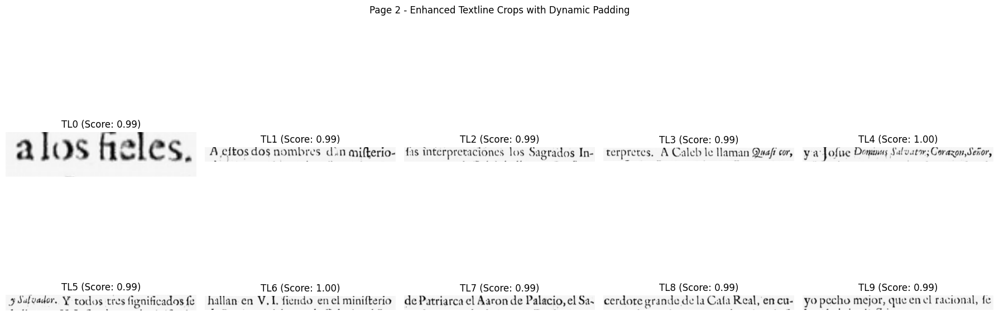

Enhanced Bounding Box Results for Page 2 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [317.9, 1931.3, 1506.0, 1980.6]
    Padded:   [312.0, 1912.0, 1511.0, 2005.0]
    Score: 0.989
  Reading Order 1 (Column 1):
    Original: [313.6, 227.0, 1492.9, 264.6]
    Padded:   [308.0, 208.0, 1497.0, 289.0]
    Score: 0.987
  Reading Order 2 (Column 1):
    Original: [304.6, 1507.1, 1496.2, 1550.1]
    Padded:   [299.0, 1488.0, 1501.0, 1575.0]
    Score: 0.994
  Reading Order 3 (Column 1):
    Original: [321.8, 1848.8, 1488.8, 1890.3]
    Padded:   [316.0, 1829.0, 1493.0, 1915.0]
    Score: 0.994
  Reading Order 4 (Column 1):
    Original: [305.4, 1763.9, 1499.4, 1808.1]
    Padded:   [300.0, 1744.0, 1504.0, 1833.0]
    Score: 0.996
  Reading Order 5 (Column 1):
    Original: [385.9, 1076.9, 1481.3, 1123.0]
    Padded:   [380.0, 1057.0, 1486.0, 1147.0]
    Score: 0.992
  Reading Order 6 (Column 1):
    Original: [303.7, 909.5, 1492.1, 953.7]
    Padded:   [298.0, 890.0, 1497.0, 9

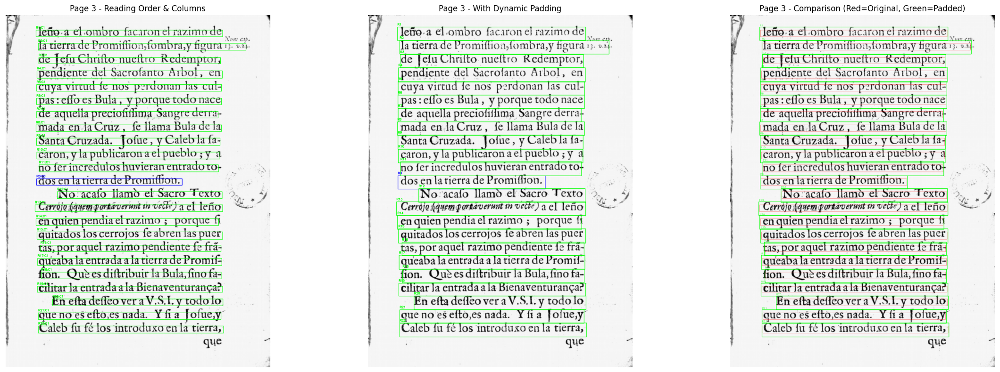

Applied padding: {'top': 19, 'bottom': 24, 'left': 5, 'right': 5}
Reading order by columns: {0: [0], 1: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}


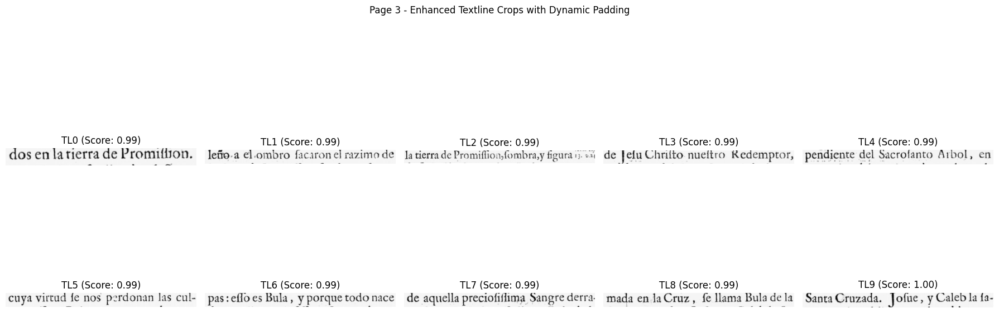

Enhanced Bounding Box Results for Page 3 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [208.5, 1851.0, 1342.2, 1891.3]
    Padded:   [203.0, 1831.0, 1347.0, 1915.0]
    Score: 0.994
  Reading Order 1 (Column 1):
    Original: [202.1, 1685.3, 1352.1, 1722.3]
    Padded:   [197.0, 1666.0, 1357.0, 1746.0]
    Score: 0.994
  Reading Order 2 (Column 1):
    Original: [208.7, 1932.8, 1358.2, 1976.9]
    Padded:   [203.0, 1913.0, 1363.0, 2000.0]
    Score: 0.995
  Reading Order 3 (Column 1):
    Original: [222.8, 1430.1, 1342.0, 1470.5]
    Padded:   [217.0, 1411.0, 1347.0, 1494.0]
    Score: 0.994
  Reading Order 4 (Column 1):
    Original: [326.6, 1097.3, 1349.5, 1140.7]
    Padded:   [321.0, 1078.0, 1354.0, 1164.0]
    Score: 0.988
  Reading Order 5 (Column 1):
    Original: [188.7, 1179.0, 1352.7, 1221.5]
    Padded:   [183.0, 1160.0, 1357.0, 1245.0]
    Score: 0.990
  Reading Order 6 (Column 1):
    Original: [211.6, 264.0, 1339.2, 302.0]
    Padded:   [206.0, 245.0, 1344.

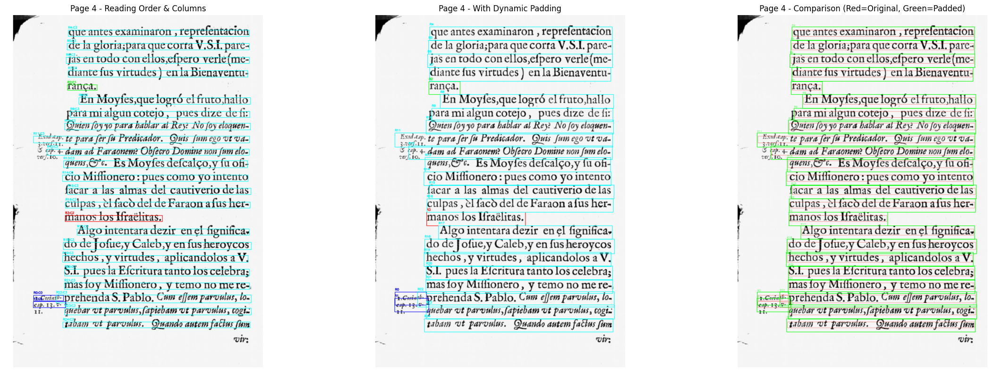

Applied padding: {'top': 20, 'bottom': 26, 'left': 5, 'right': 5}
Reading order by columns: {0: [0, 1], 1: [2], 2: [3], 3: [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]}


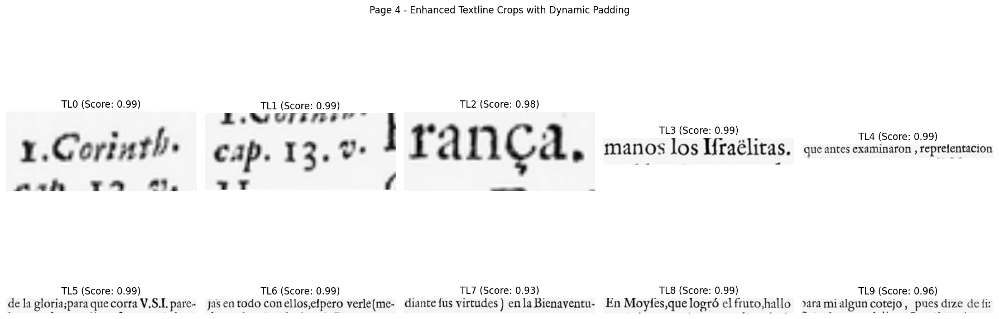

Enhanced Bounding Box Results for Page 4 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [372.0, 1821.5, 1530.1, 1863.0]
    Padded:   [367.0, 1801.0, 1535.0, 1889.0]
    Score: 0.988
  Reading Order 1 (Column 0):
    Original: [361.3, 1907.2, 1523.0, 1943.9]
    Padded:   [356.0, 1887.0, 1527.0, 1969.0]
    Score: 0.987
  Reading Order 2 (Column 1):
    Original: [320.0, 1739.6, 1529.2, 1788.2]
    Padded:   [314.0, 1719.0, 1534.0, 1814.0]
    Score: 0.980
  Reading Order 3 (Column 2):
    Original: [359.4, 1494.4, 1510.3, 1536.9]
    Padded:   [354.0, 1474.0, 1515.0, 1562.0]
    Score: 0.994
  Reading Order 4 (Column 3):
    Original: [390.5, 1076.5, 1528.5, 1115.7]
    Padded:   [385.0, 1056.0, 1533.0, 1141.0]
    Score: 0.994
  Reading Order 5 (Column 3):
    Original: [375.2, 1246.0, 979.0, 1283.5]
    Padded:   [370.0, 1225.0, 983.0, 1309.0]
    Score: 0.986
  Reading Order 6 (Column 3):
    Original: [407.3, 599.6, 1521.9, 636.8]
    Padded:   [402.0, 579.0, 1526.0,

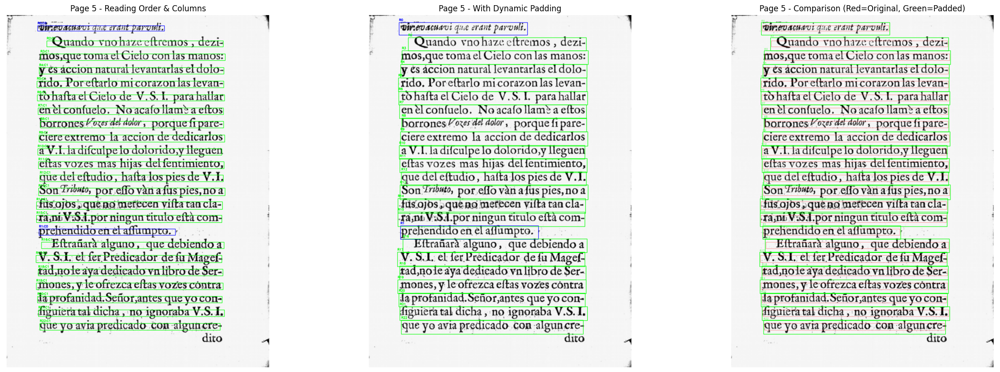

Applied padding: {'top': 20, 'bottom': 25, 'left': 5, 'right': 5}
Reading order by columns: {0: [0, 1], 1: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}


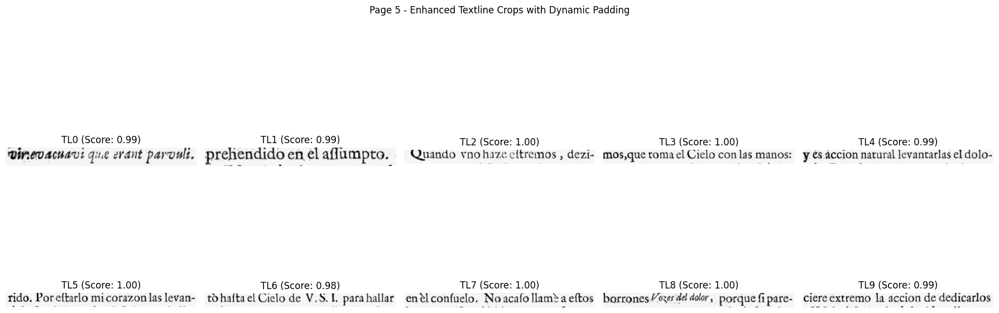

Enhanced Bounding Box Results for Page 5 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [218.6, 1916.1, 1337.4, 1958.7]
    Padded:   [213.0, 1896.0, 1342.0, 1983.0]
    Score: 0.994
  Reading Order 1 (Column 0):
    Original: [228.8, 1411.3, 1361.8, 1452.0]
    Padded:   [223.0, 1391.0, 1366.0, 1476.0]
    Score: 0.991
  Reading Order 2 (Column 1):
    Original: [209.7, 1832.1, 1363.9, 1873.1]
    Padded:   [204.0, 1812.0, 1368.0, 1898.0]
    Score: 0.996
  Reading Order 3 (Column 1):
    Original: [222.8, 241.3, 1368.3, 282.6]
    Padded:   [217.0, 221.0, 1373.0, 307.0]
    Score: 0.996
  Reading Order 4 (Column 1):
    Original: [213.7, 1329.1, 1059.2, 1368.3]
    Padded:   [208.0, 1309.0, 1064.0, 1393.0]
    Score: 0.993
  Reading Order 5 (Column 1):
    Original: [194.3, 1494.0, 1347.9, 1538.5]
    Padded:   [189.0, 1473.0, 1352.0, 1563.0]
    Score: 0.996
  Reading Order 6 (Column 1):
    Original: [204.3, 66.2, 991.1, 99.7]
    Padded:   [199.0, 46.0, 996.0, 124.0]

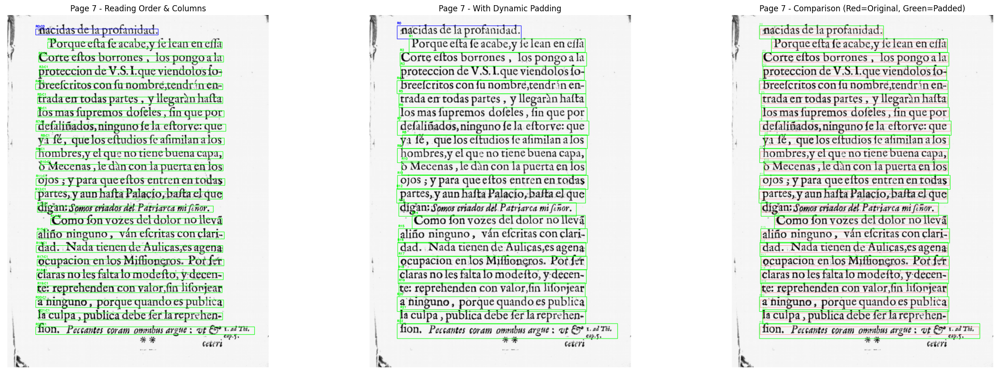

Applied padding: {'top': 20, 'bottom': 25, 'left': 5, 'right': 5}
Reading order by columns: {0: [0], 1: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}


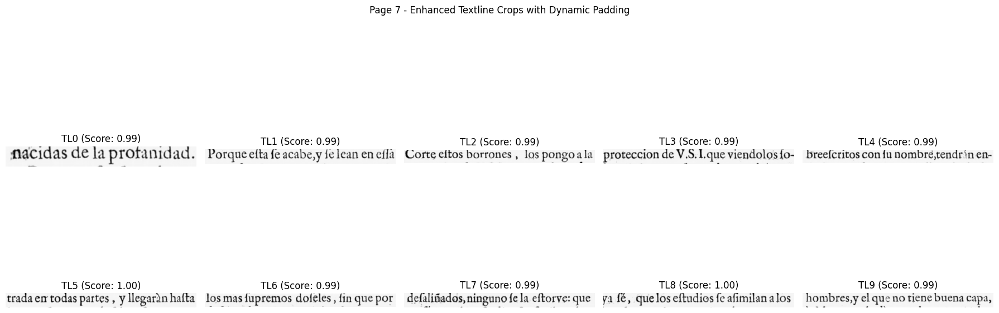

Enhanced Bounding Box Results for Page 7 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [212.5, 1851.5, 1352.2, 1894.4]
    Padded:   [207.0, 1831.0, 1357.0, 1919.0]
    Score: 0.994
  Reading Order 1 (Column 1):
    Original: [198.1, 1601.3, 1356.2, 1644.2]
    Padded:   [193.0, 1581.0, 1361.0, 1669.0]
    Score: 0.994
  Reading Order 2 (Column 1):
    Original: [189.9, 1098.4, 1351.5, 1143.6]
    Padded:   [184.0, 1078.0, 1356.0, 1168.0]
    Score: 0.993
  Reading Order 3 (Column 1):
    Original: [192.7, 86.2, 952.8, 123.2]
    Padded:   [187.0, 66.0, 957.0, 148.0]
    Score: 0.987
  Reading Order 4 (Column 1):
    Original: [192.9, 1770.3, 1358.6, 1817.0]
    Padded:   [187.0, 1750.0, 1363.0, 1842.0]
    Score: 0.993
  Reading Order 5 (Column 1):
    Original: [214.8, 338.4, 1344.0, 379.3]
    Padded:   [209.0, 318.0, 1349.0, 404.0]
    Score: 0.997
  Reading Order 6 (Column 1):
    Original: [201.2, 1518.7, 1360.3, 1558.3]
    Padded:   [196.0, 1498.0, 1365.0, 1583.0

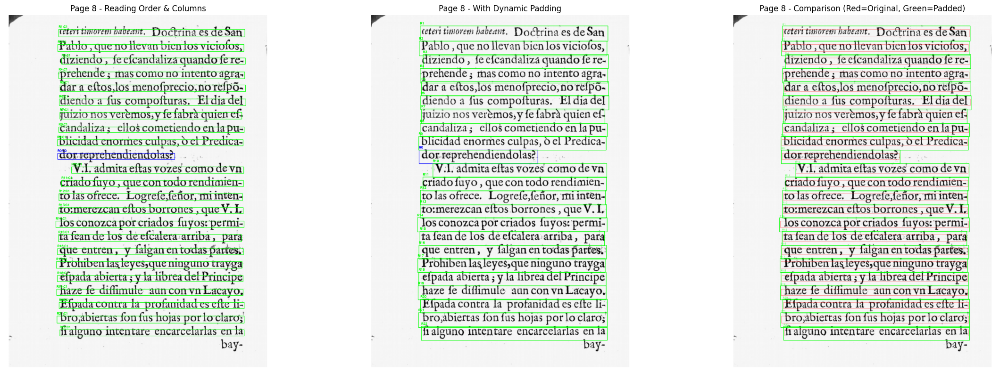

Applied padding: {'top': 21, 'bottom': 27, 'left': 5, 'right': 5}
Reading order by columns: {0: [0], 1: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}


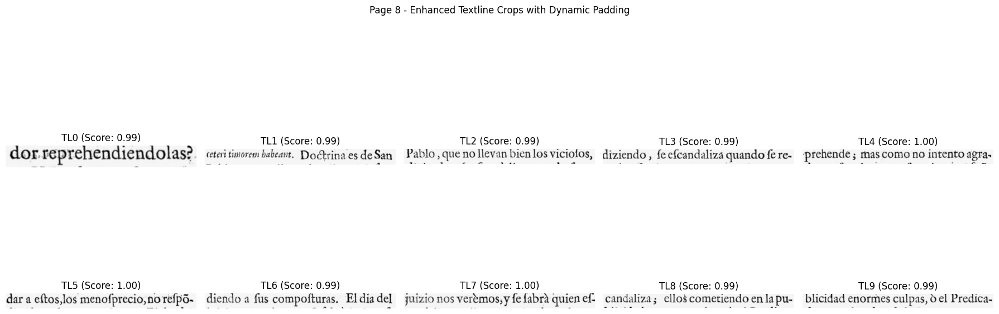

Enhanced Bounding Box Results for Page 8 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [326.2, 1618.7, 1479.5, 1656.3]
    Padded:   [321.0, 1597.0, 1484.0, 1683.0]
    Score: 0.992
  Reading Order 1 (Column 1):
    Original: [342.9, 1956.0, 1486.1, 1994.6]
    Padded:   [337.0, 1934.0, 1491.0, 2021.0]
    Score: 0.993
  Reading Order 2 (Column 1):
    Original: [414.0, 943.2, 1483.8, 983.9]
    Padded:   [409.0, 922.0, 1488.0, 1010.0]
    Score: 0.992
  Reading Order 3 (Column 1):
    Original: [335.4, 88.3, 1490.3, 135.2]
    Padded:   [330.0, 67.0, 1495.0, 162.0]
    Score: 0.987
  Reading Order 4 (Column 1):
    Original: [336.6, 1109.3, 1475.2, 1153.8]
    Padded:   [331.0, 1088.0, 1480.0, 1180.0]
    Score: 0.996
  Reading Order 5 (Column 1):
    Original: [335.1, 695.4, 1486.7, 729.5]
    Padded:   [330.0, 674.0, 1491.0, 756.0]
    Score: 0.996
  Reading Order 6 (Column 1):
    Original: [333.8, 1364.9, 1469.0, 1407.2]
    Padded:   [328.0, 1343.0, 1474.0, 1434.0]

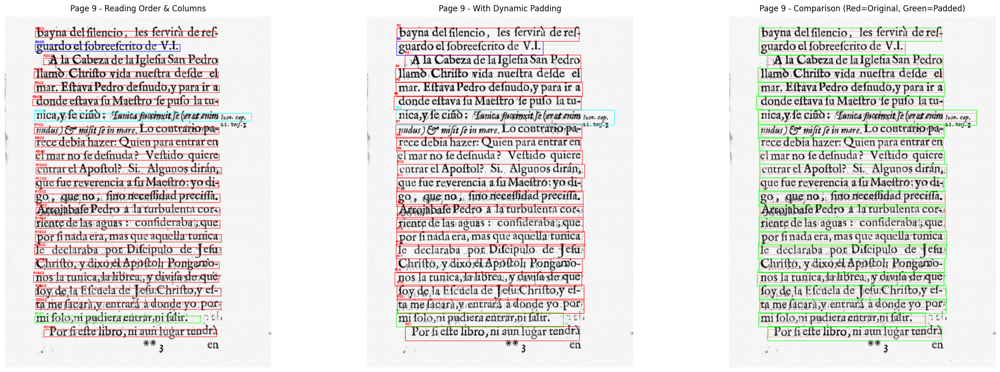

Applied padding: {'top': 20, 'bottom': 25, 'left': 5, 'right': 5}
Reading order by columns: {0: [0], 1: [1], 2: [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], 3: [22]}


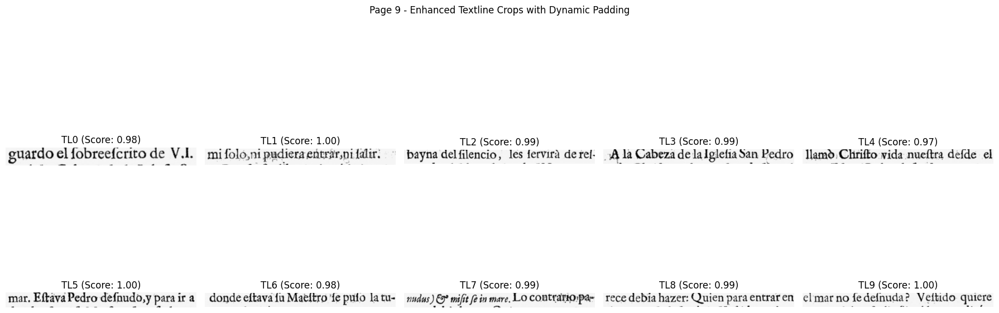

Enhanced Bounding Box Results for Page 9 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [184.9, 610.3, 1532.0, 659.5]
    Padded:   [179.0, 590.0, 1536.0, 684.0]
    Score: 0.980
  Reading Order 1 (Column 1):
    Original: [191.6, 1697.1, 1342.3, 1746.7]
    Padded:   [186.0, 1677.0, 1347.0, 1771.0]
    Score: 0.995
  Reading Order 2 (Column 2):
    Original: [185.3, 1444.8, 1343.8, 1489.7]
    Padded:   [180.0, 1424.0, 1348.0, 1514.0]
    Score: 0.992
  Reading Order 3 (Column 2):
    Original: [184.9, 697.5, 1329.7, 740.3]
    Padded:   [179.0, 677.0, 1334.0, 765.0]
    Score: 0.987
  Reading Order 4 (Column 2):
    Original: [189.2, 183.8, 1088.0, 225.6]
    Padded:   [184.0, 163.0, 1093.0, 250.0]
    Score: 0.973
  Reading Order 5 (Column 2):
    Original: [173.8, 523.9, 1324.8, 563.3]
    Padded:   [168.0, 503.0, 1329.0, 588.0]
    Score: 0.996
  Reading Order 6 (Column 2):
    Original: [187.2, 1870.4, 1214.5, 1913.0]
    Padded:   [182.0, 1850.0, 1219.0, 1938.0]
  

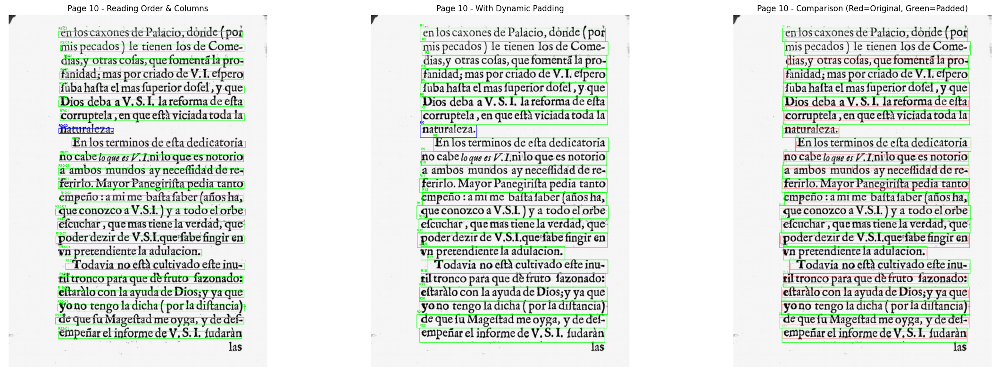

Applied padding: {'top': 20, 'bottom': 25, 'left': 5, 'right': 5}
Reading order by columns: {0: [0], 1: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]}


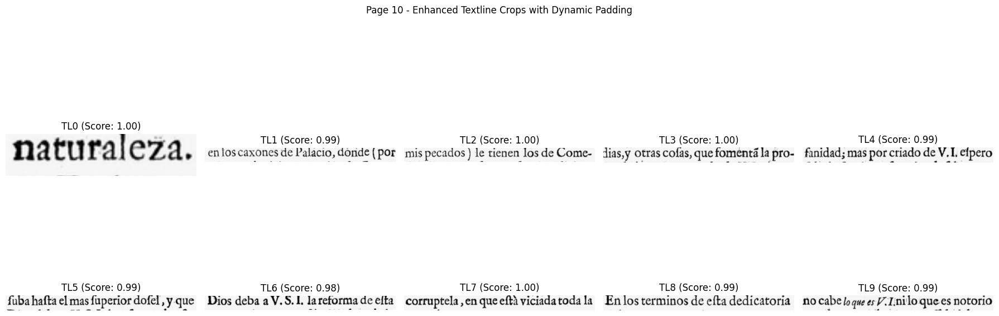

Enhanced Bounding Box Results for Page 10 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [314.3, 1880.6, 1484.0, 1921.0]
    Padded:   [309.0, 1860.0, 1489.0, 1945.0]
    Score: 0.996
  Reading Order 1 (Column 1):
    Original: [378.9, 1541.1, 1490.7, 1581.1]
    Padded:   [373.0, 1521.0, 1495.0, 1606.0]
    Score: 0.993
  Reading Order 2 (Column 1):
    Original: [340.0, 440.7, 1487.7, 485.2]
    Padded:   [334.0, 420.0, 1492.0, 510.0]
    Score: 0.995
  Reading Order 3 (Column 1):
    Original: [366.7, 269.8, 1479.2, 310.4]
    Padded:   [361.0, 249.0, 1484.0, 335.0]
    Score: 0.996
  Reading Order 4 (Column 1):
    Original: [334.4, 951.5, 1483.8, 994.7]
    Padded:   [329.0, 931.0, 1488.0, 1019.0]
    Score: 0.994
  Reading Order 5 (Column 1):
    Original: [332.7, 1034.7, 1486.2, 1078.3]
    Padded:   [327.0, 1014.0, 1491.0, 1103.0]
    Score: 0.993
  Reading Order 6 (Column 1):
    Original: [335.1, 703.7, 676.2, 735.7]
    Padded:   [330.0, 683.0, 681.0, 760.0]
  

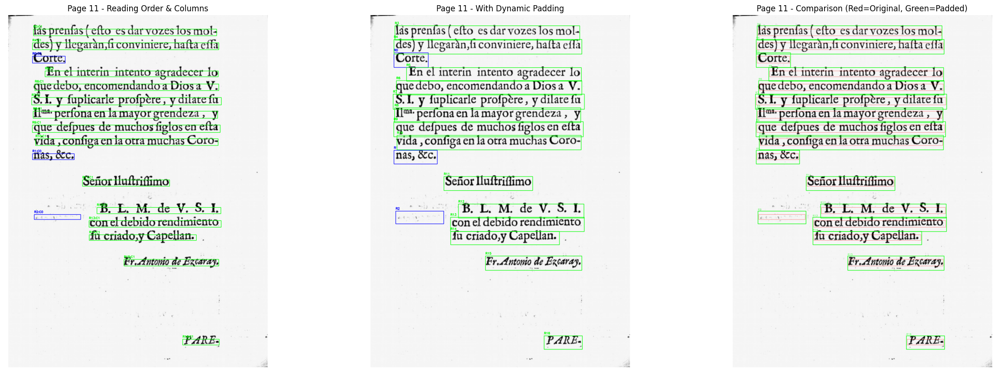

Applied padding: {'top': 21, 'bottom': 27, 'left': 5, 'right': 5}
Reading order by columns: {0: [0, 1, 2], 1: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]}


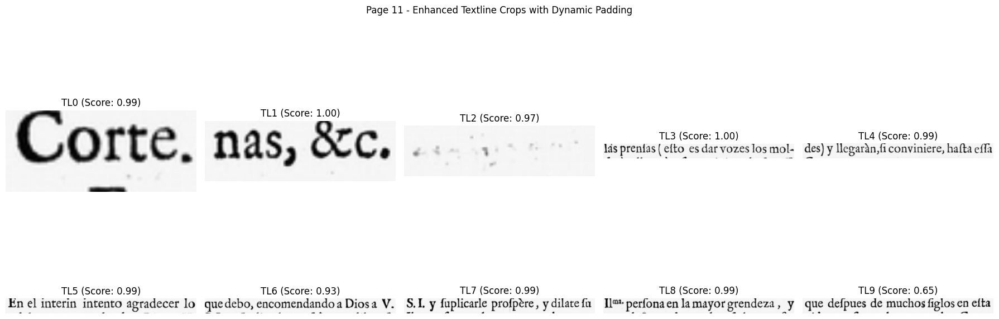

Enhanced Bounding Box Results for Page 11 (Reading Order):
  Reading Order 0 (Column 0):
    Original: [740.0, 1518.7, 1328.8, 1559.5]
    Padded:   [735.0, 1497.0, 1333.0, 1586.0]
    Score: 0.991
  Reading Order 1 (Column 0):
    Original: [524.6, 1365.8, 1189.8, 1400.4]
    Padded:   [519.0, 1344.0, 1194.0, 1427.0]
    Score: 0.996
  Reading Order 2 (Column 0):
    Original: [1105.0, 2014.6, 1331.1, 2050.4]
    Padded:   [1099.0, 1993.0, 1336.0, 2077.0]
    Score: 0.974
  Reading Order 3 (Column 1):
    Original: [171.5, 683.8, 1337.4, 729.2]
    Padded:   [166.0, 662.0, 1342.0, 756.0]
    Score: 0.996
  Reading Order 4 (Column 1):
    Original: [167.8, 512.3, 1344.4, 558.8]
    Padded:   [162.0, 491.0, 1349.0, 585.0]
    Score: 0.994
  Reading Order 5 (Column 1):
    Original: [572.1, 1195.1, 1341.7, 1234.2]
    Padded:   [567.0, 1174.0, 1346.0, 1261.0]
    Score: 0.990
  Reading Order 6 (Column 1):
    Original: [172.7, 255.3, 375.9, 298.8]
    Padded:   [167.0, 234.0, 380.0, 325.

In [7]:
# Usage example
if __name__ == "__main__":
    import time
    start_time = time.time()
    
    # Update these paths
    PDF_PATH = "/kaggle/input/ezcarazvozes/Ezcaray - Vozes (1).pdf"  # ← Update this
    MODEL_PATH = "/kaggle/input/maskrcnnr101fpn_final/pytorch/default/1/model_final (8).pth"  # ← Update this
    OUTPUT_DIR = "enhanced_textline_extraction_results3"

    # Process PDF
    process_pdf(PDF_PATH, MODEL_PATH, OUTPUT_DIR, max_pages=200, display_pages=10)
    
    print(f"Total execution time: {time.time() - start_time:.2f} seconds")

In [9]:
# import cv2
# import numpy as np
# from PIL import Image, ImageEnhance
# import os
# import json
# from transformers import TrOCRProcessor, VisionEncoderDecoderModel
# import torch
# from sklearn.cluster import KMeans
# import re
# from typing import List, Tuple, Dict, Any
# import matplotlib.pyplot as plt

# class TrOCRTextlineProcessor:
#     def __init__(self, model_name='qantev/trocr-large-spanish', device='cuda' if torch.cuda.is_available() else 'cpu'):
#         """
#         Initialize TrOCR processor with intelligent line breaking capabilities
#         """
#         print(f"Loading TrOCR model: {model_name}")
#         print(f"Using device: {device}")
        
#         self.device = device
#         self.processor = TrOCRProcessor.from_pretrained(model_name)
#         self.model = VisionEncoderDecoderModel.from_pretrained(model_name).to(device)
#         self.model.eval()
        
#         print("TrOCR model loaded successfully!")
    
#     def enhance_image_for_ocr(self, image):
#         """
#         Enhance image quality for better OCR results
#         """
#         # Convert to PIL if needed
#         if isinstance(image, np.ndarray):
#             if len(image.shape) == 3:
#                 image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#             pil_image = Image.fromarray(image)
#         else:
#             pil_image = image
        
#         # Enhance contrast and sharpness
#         enhancer = ImageEnhance.Contrast(pil_image)
#         pil_image = enhancer.enhance(1.2)
        
#         enhancer = ImageEnhance.Sharpness(pil_image)
#         pil_image = enhancer.enhance(1.1)
        
#         return pil_image
    
#     def find_text_breaking_points(self, image):
#         """
#         Intelligently find optimal points to break long text lines using image analysis
#         """
#         # Convert to grayscale if needed
#         if len(image.shape) == 3:
#             gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         else:
#             gray = image.copy()
        
#         # Apply binary threshold
#         _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        
#         # Invert if text is black on white
#         if np.mean(binary) > 127:
#             binary = cv2.bitwise_not(binary)
        
#         # Analyze vertical projection to find word gaps
#         height, width = binary.shape
#         vertical_projection = np.sum(binary, axis=0)
        
#         # Smooth the projection to reduce noise
#         kernel_size = max(3, width // 100)
#         kernel = np.ones(kernel_size) / kernel_size
#         smoothed_projection = np.convolve(vertical_projection, kernel, mode='same')
        
#         # Find valleys (gaps between words)
#         # Use adaptive threshold based on image statistics
#         threshold = np.mean(smoothed_projection) * 0.3
#         gap_positions = []
        
#         # Find continuous regions below threshold (word gaps)
#         in_gap = False
#         gap_start = 0
#         min_gap_width = max(5, width // 50)  # Minimum gap width to consider
        
#         for x in range(len(smoothed_projection)):
#             if smoothed_projection[x] < threshold:
#                 if not in_gap:
#                     gap_start = x
#                     in_gap = True
#             else:
#                 if in_gap:
#                     gap_width = x - gap_start
#                     if gap_width >= min_gap_width:
#                         gap_center = gap_start + gap_width // 2
#                         gap_positions.append((gap_center, gap_width))
#                     in_gap = False
        
#         # Sort gaps by width (prefer larger gaps for breaking)
#         gap_positions.sort(key=lambda x: x[1], reverse=True)
        
#         return gap_positions, smoothed_projection
    
#     def split_textline_intelligently(self, image, max_width=800, min_segment_width=200):
#         """
#         Split long textlines at optimal word boundaries
#         """
#         height, width = image.shape[:2]
        
#         # If image is not too wide, return as is
#         if width <= max_width:
#             return [image]
        
#         # Find breaking points
#         gap_positions, projection = self.find_text_breaking_points(image)
        
#         segments = []
        
#         if not gap_positions:
#             # Fallback: split at middle if no gaps found
#             split_point = width // 2
#             segments = [
#                 image[:, :split_point],
#                 image[:, split_point:]
#             ]
#         else:
#             # Find optimal breaking point around the middle
#             target_split = width // 2
#             best_gap = min(gap_positions, key=lambda x: abs(x[0] - target_split))
#             split_point = best_gap[0]
            
#             # Ensure minimum segment width
#             if split_point < min_segment_width:
#                 split_point = min_segment_width
#             elif width - split_point < min_segment_width:
#                 split_point = width - min_segment_width
            
#             left_segment = image[:, :split_point]
#             right_segment = image[:, split_point:]
            
#             # Recursively split if segments are still too wide
#             segments.extend(self.split_textline_intelligently(left_segment, max_width, min_segment_width))
#             segments.extend(self.split_textline_intelligently(right_segment, max_width, min_segment_width))
        
#         return segments
    
#     def process_single_textline(self, image_path, save_debug=False):
#         """
#         Process a single textline image with intelligent splitting and OCR
#         """
#         # Load image
#         image = cv2.imread(image_path)
#         if image is None:
#             return ""
        
#         # Split long lines intelligently
#         segments = self.split_textline_intelligently(image)
        
#         if save_debug:
#             debug_dir = os.path.join(os.path.dirname(image_path), "debug_splits")
#             os.makedirs(debug_dir, exist_ok=True)
#             base_name = os.path.splitext(os.path.basename(image_path))[0]
            
#             for i, segment in enumerate(segments):
#                 debug_path = os.path.join(debug_dir, f"{base_name}_segment_{i}.png")
#                 cv2.imwrite(debug_path, segment)
        
#         # Process each segment with TrOCR
#         segment_texts = []
        
#         for i, segment in enumerate(segments):
#             try:
#                 # Enhance image for OCR
#                 pil_image = self.enhance_image_for_ocr(segment)
                
#                 # Process with TrOCR
#                 pixel_values = self.processor(images=pil_image, return_tensors="pt").pixel_values.to(self.device)
                
#                 with torch.no_grad():
#                     generated_ids = self.model.generate(pixel_values, max_length=512)
#                     text = self.processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
                
#                 if text.strip():
#                     segment_texts.append(text.strip())
                    
#             except Exception as e:
#                 print(f"Error processing segment {i} of {image_path}: {e}")
#                 continue
        
#         # Combine segments into single line
#         combined_text = " ".join(segment_texts)
#         return combined_text
    
#     def process_page_textlines(self, page_dir, save_debug=False):
#         """
#         Process all textlines in a page directory
#         """
#         textlines_dir = os.path.join(page_dir, "textlines")
#         if not os.path.exists(textlines_dir):
#             print(f"No textlines directory found in {page_dir}")
#             return []
        
#         # Load bboxes.json for reading order
#         bboxes_path = os.path.join(page_dir, "bboxes.json")
#         reading_order = []
        
#         if os.path.exists(bboxes_path):
#             with open(bboxes_path, 'r') as f:
#                 bbox_data = json.load(f)
#                 reading_order = bbox_data.get('textlines', [])
        
#         # Process textlines in reading order
#         page_texts = []
#         textline_files = []
        
#         if reading_order:
#             # Sort by reading order index
#             reading_order.sort(key=lambda x: x['reading_order_index'])
#             for textline_info in reading_order:
#                 filename = textline_info['crop_filename']
#                 textline_files.append(filename)
#         else:
#             # Fallback: use alphabetical order
#             textline_files = sorted([f for f in os.listdir(textlines_dir) if f.endswith('.png')])
        
#         print(f"Processing {len(textline_files)} textlines in {os.path.basename(page_dir)}")
        
#         for i, filename in enumerate(textline_files):
#             image_path = os.path.join(textlines_dir, filename)
            
#             if os.path.exists(image_path):
#                 print(f"  Processing {filename} ({i+1}/{len(textline_files)})")
#                 text = self.process_single_textline(image_path, save_debug)
                
#                 page_texts.append({
#                     'textline_index': i,
#                     'filename': filename,
#                     'text': text,
#                     'reading_order': i
#                 })
#             else:
#                 print(f"  Warning: {filename} not found")
        
#         return page_texts
    
#     def save_page_ocr_results(self, page_dir, page_texts, page_num):
#         """
#         Save OCR results for a single page
#         """
#         page_name = os.path.basename(page_dir)
        
#         # Save as JSON with detailed information
#         json_path = os.path.join(page_dir, "ocr_results.json")
#         json_data = {
#             "page_info": {
#                 "page_number": page_num + 1,
#                 "page_directory": page_name,
#                 "total_textlines": len(page_texts),
#                 "processing_timestamp": str(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")
#             },
#             "textlines": page_texts,
#             "full_page_text": "\n".join([t['text'] for t in page_texts if t['text'].strip()])
#         }
        
#         with open(json_path, 'w', encoding='utf-8') as f:
#             json.dump(json_data, f, indent=2, ensure_ascii=False)
        
#         # Save as plain text
#         txt_path = os.path.join(page_dir, "page_text.txt")
#         with open(txt_path, 'w', encoding='utf-8') as f:
#             for text_info in page_texts:
#                 if text_info['text'].strip():
#                     f.write(text_info['text'] + '\n')
        
#         print(f"Saved OCR results: {json_path}, {txt_path}")
        
#         return json_data
    
#     def combine_all_pages_ocr(self, output_dir):
#         """
#         Combine OCR results from all pages into consolidated files
#         """
#         all_pages_data = []
#         all_text_lines = []
        
#         # Find all page directories
#         page_dirs = []
#         for item in os.listdir(output_dir):
#             item_path = os.path.join(output_dir, item)
#             if os.path.isdir(item_path) and item.startswith('page_'):
#                 page_dirs.append(item_path)
        
#         # Sort page directories
#         page_dirs.sort()
        
#         print(f"Combining OCR results from {len(page_dirs)} pages...")
        
#         for page_dir in page_dirs:
#             ocr_json_path = os.path.join(page_dir, "ocr_results.json")
            
#             if os.path.exists(ocr_json_path):
#                 with open(ocr_json_path, 'r', encoding='utf-8') as f:
#                     page_data = json.load(f)
#                     all_pages_data.append(page_data)
                    
#                     # Extract text lines
#                     page_text = page_data.get('full_page_text', '')
#                     if page_text.strip():
#                         all_text_lines.append(f"=== PAGE {page_data['page_info']['page_number']} ===")
#                         all_text_lines.append(page_text)
#                         all_text_lines.append("")  # Empty line between pages
        
#         # Save combined JSON
#         combined_json_path = os.path.join(output_dir, "complete_document_ocr.json")
#         combined_data = {
#             "document_info": {
#                 "total_pages": len(all_pages_data),
#                 "total_textlines": sum(p['page_info']['total_textlines'] for p in all_pages_data),
#                 "processing_complete": True
#             },
#             "pages": all_pages_data
#         }
        
#         with open(combined_json_path, 'w', encoding='utf-8') as f:
#             json.dump(combined_data, f, indent=2, ensure_ascii=False)
        
#         # Save combined text
#         combined_txt_path = os.path.join(output_dir, "complete_document_text.txt")
#         with open(combined_txt_path, 'w', encoding='utf-8') as f:
#             f.write('\n'.join(all_text_lines))
        
#         # Save simple clean text (no page markers)
#         clean_txt_path = os.path.join(output_dir, "document_clean_text.txt")
#         clean_lines = []
#         for page_data in all_pages_data:
#             page_text = page_data.get('full_page_text', '')
#             if page_text.strip():
#                 clean_lines.append(page_text)
        
#         with open(clean_txt_path, 'w', encoding='utf-8') as f:
#             f.write('\n\n'.join(clean_lines))
        
#         print(f"Combined OCR results saved:")
#         print(f"  - JSON: {combined_json_path}")
#         print(f"  - Full text: {combined_txt_path}")
#         print(f"  - Clean text: {clean_txt_path}")
#         print(f"  - Total pages: {len(all_pages_data)}")
#         print(f"  - Total textlines: {combined_data['document_info']['total_textlines']}")
        
#         return combined_data

# def process_extracted_textlines_with_trocr(output_dir, model_name='qantev/trocr-large-spanish', 
#                                          max_pages=None, save_debug=False):
#     """
#     Main function to process all extracted textlines with TrOCR
    
#     Args:
#         output_dir: Directory containing the extracted textlines (from your existing code)
#         model_name: TrOCR model to use
#         max_pages: Maximum number of pages to process (None for all)
#         save_debug: Save debug images showing line splits
#     """
    
#     print(f"Starting TrOCR processing for directory: {output_dir}")
    
#     # Initialize TrOCR processor
#     trocr_processor = TrOCRTextlineProcessor(model_name)
    
#     # Find all page directories
#     page_dirs = []
#     for item in os.listdir(output_dir):
#         item_path = os.path.join(output_dir, item)
#         if os.path.isdir(item_path) and item.startswith('page_'):
#             page_dirs.append(item_path)
    
#     # Sort and limit pages if specified
#     page_dirs.sort()
#     if max_pages:
#         page_dirs = page_dirs[:max_pages]
    
#     print(f"Found {len(page_dirs)} pages to process")
    
#     # Process each page
#     processed_pages = 0
#     for i, page_dir in enumerate(page_dirs):
#         page_num = int(os.path.basename(page_dir).split('_')[1])
#         print(f"\n{'='*50}")
#         print(f"Processing Page {page_num + 1} ({i+1}/{len(page_dirs)})")
#         print(f"{'='*50}")
        
#         try:
#             # Process all textlines in the page
#             page_texts = trocr_processor.process_page_textlines(page_dir, save_debug)
            
#             if page_texts:
#                 # Save page OCR results
#                 page_data = trocr_processor.save_page_ocr_results(page_dir, page_texts, page_num)
#                 processed_pages += 1
                
#                 print(f"Page {page_num + 1} completed: {len(page_texts)} textlines processed")
                
#                 # Show sample results
#                 sample_texts = [t['text'] for t in page_texts[:3] if t['text'].strip()]
#                 if sample_texts:
#                     print("Sample OCR results:")
#                     for j, text in enumerate(sample_texts):
#                         print(f"  Line {j+1}: {text[:100]}{'...' if len(text) > 100 else ''}")
#             else:
#                 print(f"No textlines found in page {page_num + 1}")
                
#         except Exception as e:
#             print(f"Error processing page {page_num + 1}: {e}")
#             continue
    
#     print(f"\n{'='*60}")
#     print(f"Individual page processing completed!")
#     print(f"Successfully processed: {processed_pages}/{len(page_dirs)} pages")
#     print(f"{'='*60}")
    
#     # Combine all pages
#     if processed_pages > 0:
#         print("\nCombining all page results...")
#         combined_data = trocr_processor.combine_all_pages_ocr(output_dir)
        
#         print(f"\n{'='*60}")
#         print(f"PROCESSING COMPLETE!")
#         print(f"{'='*60}")
#         print(f"📄 Total pages processed: {processed_pages}")
#         print(f"📝 Total textlines: {combined_data['document_info']['total_textlines']}")
#         print(f"📁 Results saved in: {output_dir}")
#         print(f"🔍 Key files:")
#         print(f"   - complete_document_ocr.json (detailed results)")
#         print(f"   - complete_document_text.txt (formatted text)")
#         print(f"   - document_clean_text.txt (clean text only)")
#         print(f"{'='*60}")
        
#         return combined_data
#     else:
#         print("No pages were successfully processed!")
#         return None

In [14]:
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import os
import json
from transformers import TrOCRProcessor, VisionEncoderDecoderModel
import torch
from sklearn.cluster import KMeans
import re
from typing import List, Tuple, Dict, Any
import matplotlib.pyplot as plt

class TrOCRTextlineProcessor:
    def __init__(self, model_name='qantev/trocr-large-spanish', device='cuda' if torch.cuda.is_available() else 'cpu'):
        """
        Initialize TrOCR processor with intelligent line breaking capabilities
        """
        print(f"Loading TrOCR model: {model_name}")
        print(f"Using device: {device}")
        
        self.device = device
        self.processor = TrOCRProcessor.from_pretrained(model_name)
        self.model = VisionEncoderDecoderModel.from_pretrained(model_name).to(device)
        self.model.eval()
        
        print("TrOCR model loaded successfully!")
    
    def enhance_image_for_ocr(self, image):
        """
        Enhance image quality for better OCR results
        """
        # Convert to PIL if needed
        if isinstance(image, np.ndarray):
            if len(image.shape) == 3:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            pil_image = Image.fromarray(image)
        else:
            pil_image = image
        
        # Enhance contrast and sharpness
        enhancer = ImageEnhance.Contrast(pil_image)
        pil_image = enhancer.enhance(1.2)
        
        enhancer = ImageEnhance.Sharpness(pil_image)
        pil_image = enhancer.enhance(1.1)
        
        return pil_image
    
    def analyze_textline_layout(self, page_textlines_info):
        """
        FIXED: Analyze textlines to understand column layout and proper reading order
        """
        if not page_textlines_info:
            return page_textlines_info
        
        # Extract bounding box information for layout analysis
        positions = []
        for textline in page_textlines_info:
            if 'bbox' in textline:
                bbox = textline['bbox']
                # Calculate center positions
                center_x = (bbox[0] + bbox[2]) / 2
                center_y = (bbox[1] + bbox[3]) / 2
                positions.append({
                    'textline': textline,
                    'center_x': center_x,
                    'center_y': center_y,
                    'left': bbox[0],
                    'right': bbox[2],
                    'top': bbox[1],
                    'bottom': bbox[3]
                })
        
        if not positions:
            return page_textlines_info
        
        # Detect column structure using K-means clustering on x-coordinates
        x_coords = np.array([[pos['center_x']] for pos in positions])
        
        # Try to detect 2 columns (most common for historical documents)
        try:
            kmeans = KMeans(n_clusters=2, random_state=42)
            column_labels = kmeans.fit_predict(x_coords)
            
            # Separate into columns
            left_column = []
            right_column = []
            
            for i, pos in enumerate(positions):
                if column_labels[i] == 0:
                    left_column.append(pos)
                else:
                    right_column.append(pos)
            
            # Determine which is actually left/right based on x-coordinates
            if left_column and right_column:
                avg_x_col0 = np.mean([pos['center_x'] for pos in left_column])
                avg_x_col1 = np.mean([pos['center_x'] for pos in right_column])
                
                if avg_x_col0 > avg_x_col1:
                    left_column, right_column = right_column, left_column
            
            # Sort each column by y-coordinate (top to bottom)
            left_column.sort(key=lambda x: x['center_y'])
            right_column.sort(key=lambda x: x['center_y'])
            
            # Create proper reading order: left column first, then right column
            ordered_textlines = []
            
            # Add left column textlines
            for pos in left_column:
                textline = pos['textline'].copy()
                textline['column'] = 'left'
                ordered_textlines.append(textline)
            
            # Add right column textlines  
            for pos in right_column:
                textline = pos['textline'].copy()
                textline['column'] = 'right'
                ordered_textlines.append(textline)
            
            print(f"Detected 2-column layout: {len(left_column)} left, {len(right_column)} right")
            return ordered_textlines
            
        except:
            # Fallback: sort by y-coordinate only
            positions.sort(key=lambda x: (x['center_y'], x['center_x']))
            return [pos['textline'] for pos in positions]
    
    def resize_image_for_trocr(self, image, max_width=2048, max_height=768):
        """
        FIXED: Properly resize image for TrOCR without losing aspect ratio
        """
        height, width = image.shape[:2]
        
        # Calculate scaling factor to fit within limits while maintaining aspect ratio
        scale_w = max_width / width if width > max_width else 1.0
        scale_h = max_height / height if height > max_height else 1.0
        scale = min(scale_w, scale_h)
        
        if scale < 1.0:
            new_width = int(width * scale)
            new_height = int(height * scale)
            image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_LANCZOS4)
        
        return image
    
    def process_single_textline(self, image_path, save_debug=False):
        """
        FIXED: Process textline without unnecessary segmentation that breaks context
        """
        # Load image
        image = cv2.imread(image_path)
        if image is None:
            return ""
        
        try:
            # Resize image appropriately for TrOCR
            processed_image = self.resize_image_for_trocr(image)
            
            # Enhance image for OCR
            pil_image = self.enhance_image_for_ocr(processed_image)
            
            # Process with TrOCR - keep the full context
            pixel_values = self.processor(images=pil_image, return_tensors="pt").pixel_values.to(self.device)
            
            with torch.no_grad():
                generated_ids = self.model.generate(
                    pixel_values, 
                    max_length=512,
                    num_beams=4,  # Improved beam search
                    early_stopping=True
                )
                text = self.processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
            
            return text.strip()
                    
        except Exception as e:
            print(f"Error processing textline {image_path}: {e}")
            return ""
    
    def load_textline_metadata(self, page_dir):
        """
        FIXED: Load textline metadata with proper bbox information
        """
        bboxes_path = os.path.join(page_dir, "bboxes.json")
        textlines_info = []
        
        if os.path.exists(bboxes_path):
            try:
                with open(bboxes_path, 'r') as f:
                    bbox_data = json.load(f)
                    textlines_info = bbox_data.get('textlines', [])
                    
                # Ensure we have the required fields
                for textline in textlines_info:
                    if 'bbox' not in textline and 'coordinates' in textline:
                        # Convert coordinates to bbox format if needed
                        coords = textline['coordinates']
                        if isinstance(coords, list) and len(coords) >= 4:
                            textline['bbox'] = coords[:4]  # [x1, y1, x2, y2]
                            
            except Exception as e:
                print(f"Error loading bboxes.json: {e}")
        
        return textlines_info
    
    def process_page_textlines(self, page_dir, save_debug=False):
        """
        FIXED: Process textlines with proper spatial understanding and reading order
        """
        textlines_dir = os.path.join(page_dir, "textlines")
        if not os.path.exists(textlines_dir):
            print(f"No textlines directory found in {page_dir}")
            return []
        
        # Load textline metadata with spatial information
        textlines_info = self.load_textline_metadata(page_dir)
        
        # Analyze layout and determine proper reading order
        ordered_textlines = self.analyze_textline_layout(textlines_info)
        
        # Process textlines in correct order
        page_texts = []
        
        if ordered_textlines:
            print(f"Processing {len(ordered_textlines)} textlines with detected layout in {os.path.basename(page_dir)}")
            
            for i, textline_info in enumerate(ordered_textlines):
                filename = textline_info.get('crop_filename', f"textline_{i:03d}.png")
                image_path = os.path.join(textlines_dir, filename)
                
                if os.path.exists(image_path):
                    print(f"  Processing {filename} ({i+1}/{len(ordered_textlines)}) - {textline_info.get('column', 'unknown')} column")
                    text = self.process_single_textline(image_path, save_debug)
                    
                    page_texts.append({
                        'textline_index': i,
                        'filename': filename,
                        'text': text,
                        'reading_order': i,
                        'column': textline_info.get('column', 'unknown'),
                        'bbox': textline_info.get('bbox', [])
                    })
                else:
                    print(f"  Warning: {filename} not found")
        else:
            # Fallback: process files alphabetically
            textline_files = sorted([f for f in os.listdir(textlines_dir) if f.endswith('.png')])
            print(f"Processing {len(textline_files)} textlines (fallback order) in {os.path.basename(page_dir)}")
            
            for i, filename in enumerate(textline_files):
                image_path = os.path.join(textlines_dir, filename)
                print(f"  Processing {filename} ({i+1}/{len(textline_files)})")
                text = self.process_single_textline(image_path, save_debug)
                
                page_texts.append({
                    'textline_index': i,
                    'filename': filename,
                    'text': text,
                    'reading_order': i,
                    'column': 'unknown',
                    'bbox': []
                })
        
        return page_texts
    
    def save_page_ocr_results(self, page_dir, page_texts, page_num):
        """
        Save OCR results for a single page with improved formatting
        """
        page_name = os.path.basename(page_dir)
        
        # Save as JSON with detailed information
        json_path = os.path.join(page_dir, "ocr_results.json")
        json_data = {
            "page_info": {
                "page_number": page_num + 1,
                "page_directory": page_name,
                "total_textlines": len(page_texts),
                "processing_timestamp": str(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"),
                "layout_detected": any(t.get('column') != 'unknown' for t in page_texts)
            },
            "textlines": page_texts,
            "full_page_text": "\n".join([t['text'] for t in page_texts if t['text'].strip()])
        }
        
        with open(json_path, 'w', encoding='utf-8') as f:
            json.dump(json_data, f, indent=2, ensure_ascii=False)
        
        # Save as plain text with column awareness
        txt_path = os.path.join(page_dir, "page_text.txt")
        with open(txt_path, 'w', encoding='utf-8') as f:
            current_column = None
            for text_info in page_texts:
                if text_info['text'].strip():
                    # Add column separator if needed
                    if text_info.get('column') != current_column and text_info.get('column') != 'unknown':
                        if current_column is not None:
                            f.write(f"\n--- {text_info['column'].upper()} COLUMN ---\n")
                        current_column = text_info.get('column')
                    
                    f.write(text_info['text'] + '\n')
        
        print(f"Saved OCR results: {json_path}, {txt_path}")
        
        return json_data
    
    def combine_all_pages_ocr(self, output_dir):
        """
        Combine OCR results from all pages into consolidated files
        """
        all_pages_data = []
        all_text_lines = []
        
        # Find all page directories
        page_dirs = []
        for item in os.listdir(output_dir):
            item_path = os.path.join(output_dir, item)
            if os.path.isdir(item_path) and item.startswith('page_'):
                page_dirs.append(item_path)
        
        # Sort page directories
        page_dirs.sort()
        
        print(f"Combining OCR results from {len(page_dirs)} pages...")
        
        for page_dir in page_dirs:
            ocr_json_path = os.path.join(page_dir, "ocr_results.json")
            
            if os.path.exists(ocr_json_path):
                with open(ocr_json_path, 'r', encoding='utf-8') as f:
                    page_data = json.load(f)
                    all_pages_data.append(page_data)
                    
                    # Extract text lines
                    page_text = page_data.get('full_page_text', '')
                    if page_text.strip():
                        all_text_lines.append(f"=== PAGE {page_data['page_info']['page_number']} ===")
                        all_text_lines.append(page_text)
                        all_text_lines.append("")  # Empty line between pages
        
        # Save combined JSON
        combined_json_path = os.path.join(output_dir, "complete_document_ocr.json")
        combined_data = {
            "document_info": {
                "total_pages": len(all_pages_data),
                "total_textlines": sum(p['page_info']['total_textlines'] for p in all_pages_data),
                "processing_complete": True,
                "layout_analysis_used": any(p['page_info'].get('layout_detected', False) for p in all_pages_data)
            },
            "pages": all_pages_data
        }
        
        with open(combined_json_path, 'w', encoding='utf-8') as f:
            json.dump(combined_data, f, indent=2, ensure_ascii=False)
        
        # Save combined text
        combined_txt_path = os.path.join(output_dir, "complete_document_text.txt")
        with open(combined_txt_path, 'w', encoding='utf-8') as f:
            f.write('\n'.join(all_text_lines))
        
        # Save simple clean text (no page markers)
        clean_txt_path = os.path.join(output_dir, "document_clean_text.txt")
        clean_lines = []
        for page_data in all_pages_data:
            page_text = page_data.get('full_page_text', '')
            if page_text.strip():
                clean_lines.append(page_text)
        
        with open(clean_txt_path, 'w', encoding='utf-8') as f:
            f.write('\n\n'.join(clean_lines))
        
        print(f"Combined OCR results saved:")
        print(f"  - JSON: {combined_json_path}")
        print(f"  - Full text: {combined_txt_path}")
        print(f"  - Clean text: {clean_txt_path}")
        print(f"  - Total pages: {len(all_pages_data)}")
        print(f"  - Total textlines: {combined_data['document_info']['total_textlines']}")
        print(f"  - Layout analysis: {'YES' if combined_data['document_info']['layout_analysis_used'] else 'NO'}")
        
        return combined_data

def process_extracted_textlines_with_trocr(output_dir, model_name='qantev/trocr-large-spanish', 
                                         max_pages=None, save_debug=False):
    """
    Main function to process all extracted textlines with TrOCR
    
    Args:
        output_dir: Directory containing the extracted textlines (from your existing code)
        model_name: TrOCR model to use
        max_pages: Maximum number of pages to process (None for all)
        save_debug: Save debug images showing line splits
    """
    
    print(f"Starting FIXED TrOCR processing for directory: {output_dir}")
    
    # Initialize TrOCR processor
    trocr_processor = TrOCRTextlineProcessor(model_name)
    
    # Find all page directories
    page_dirs = []
    for item in os.listdir(output_dir):
        item_path = os.path.join(output_dir, item)
        if os.path.isdir(item_path) and item.startswith('page_'):
            page_dirs.append(item_path)
    
    # Sort and limit pages if specified
    page_dirs.sort()
    if max_pages:
        page_dirs = page_dirs[:max_pages]
    
    print(f"Found {len(page_dirs)} pages to process")
    
    # Process each page
    processed_pages = 0
    for i, page_dir in enumerate(page_dirs):
        page_num = int(os.path.basename(page_dir).split('_')[1])
        print(f"\n{'='*50}")
        print(f"Processing Page {page_num + 1} ({i+1}/{len(page_dirs)})")
        print(f"{'='*50}")
        
        try:
            # Process all textlines in the page
            page_texts = trocr_processor.process_page_textlines(page_dir, save_debug)
            
            if page_texts:
                # Save page OCR results
                page_data = trocr_processor.save_page_ocr_results(page_dir, page_texts, page_num)
                processed_pages += 1
                
                print(f"Page {page_num + 1} completed: {len(page_texts)} textlines processed")
                
                # Show sample results
                sample_texts = [t['text'] for t in page_texts[:3] if t['text'].strip()]
                if sample_texts:
                    print("Sample OCR results:")
                    for j, text in enumerate(sample_texts):
                        print(f"  Line {j+1}: {text[:100]}{'...' if len(text) > 100 else ''}")
            else:
                print(f"No textlines found in page {page_num + 1}")
                
        except Exception as e:
            print(f"Error processing page {page_num + 1}: {e}")
            continue
    
    print(f"\n{'='*60}")
    print(f"Individual page processing completed!")
    print(f"Successfully processed: {processed_pages}/{len(page_dirs)} pages")
    print(f"{'='*60}")
    
    # Combine all pages
    if processed_pages > 0:
        print("\nCombining all page results...")
        combined_data = trocr_processor.combine_all_pages_ocr(output_dir)
        
        print(f"\n{'='*60}")
        print(f"PROCESSING COMPLETE!")
        print(f"{'='*60}")
        print(f"📄 Total pages processed: {processed_pages}")
        print(f"📝 Total textlines: {combined_data['document_info']['total_textlines']}")
        print(f"📁 Results saved in: {output_dir}")
        print(f"🔍 Key files:")
        print(f"   - complete_document_ocr.json (detailed results)")
        print(f"   - complete_document_text.txt (formatted text)")
        print(f"   - document_clean_text.txt (clean text only)")
        print(f"✅ Layout Analysis: {'ENABLED' if combined_data['document_info']['layout_analysis_used'] else 'DISABLED'}")
        print(f"{'='*60}")
        
        return combined_data
    else:
        print("No pages were successfully processed!")
        return None

In [15]:
# Example usage:
if __name__ == "__main__":
    # Assuming you have already run your textline extraction and have results in output_dir
    import time
    start_time = time.time();
    output_directory = "/kaggle/working/enhanced_textline_extraction_results3"
    
    # Process with TrOCR
    results = process_extracted_textlines_with_trocr(
        output_dir=output_directory,
        model_name='qantev/trocr-large-spanish',  # or use other TrOCR models
        max_pages=None,  # Process all pages
        save_debug=True  # Save debug images showing line splits
    )
    end_time = time.time()
    print(end_time-start_time)

Starting FIXED TrOCR processing for directory: /kaggle/working/enhanced_textline_extraction_results3
Loading TrOCR model: qantev/trocr-large-spanish
Using device: cuda


Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.51.3"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

TrOCR model loaded successfully!
Found 11 pages to process

Processing Page 1 (1/11)
Processing 21 textlines with detected layout in page_000
  Processing textline_000_col0_pos00.png (1/21) - 0 column


/usr/local/lib/python3.11/dist-packages/transformers/generation/utils.py:1667: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed in v5. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(


  Processing textline_001_col0_pos01.png (2/21) - 0 column
  Processing textline_002_col1_pos00.png (3/21) - 1 column
  Processing textline_003_col1_pos01.png (4/21) - 1 column
  Processing textline_004_col1_pos02.png (5/21) - 1 column
  Processing textline_005_col1_pos03.png (6/21) - 1 column
  Processing textline_006_col1_pos04.png (7/21) - 1 column
  Processing textline_007_col1_pos05.png (8/21) - 1 column
  Processing textline_008_col1_pos06.png (9/21) - 1 column
  Processing textline_009_col1_pos07.png (10/21) - 1 column
  Processing textline_010_col1_pos08.png (11/21) - 1 column
  Processing textline_011_col1_pos09.png (12/21) - 1 column
  Processing textline_012_col1_pos10.png (13/21) - 1 column
  Processing textline_013_col1_pos11.png (14/21) - 1 column
  Processing textline_014_col1_pos12.png (15/21) - 1 column
  Processing textline_015_col1_pos13.png (16/21) - 1 column
  Processing textline_016_col1_pos14.png (17/21) - 1 column
  Processing textline_017_col2_pos00.png (18/21)

In [4]:
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import os
import json
from transformers import TrOCRProcessor, VisionEncoderDecoderModel
import torch
from sklearn.cluster import KMeans
import re
from typing import List, Tuple, Dict, Any
import matplotlib.pyplot as plt

class TrOCRTextlineProcessor:
    def __init__(self, model_name='qantev/trocr-large-spanish', device='cuda' if torch.cuda.is_available() else 'cpu'):
        """
        Initialize TrOCR processor with intelligent line breaking capabilities
        """
        print(f"Loading TrOCR model: {model_name}")
        print(f"Using device: {device}")
        
        self.device = device
        self.processor = TrOCRProcessor.from_pretrained(model_name)
        self.model = VisionEncoderDecoderModel.from_pretrained(model_name).to(device)
        self.model.eval()
        
        print("TrOCR model loaded successfully!")
    
    def enhance_image_for_ocr(self, image):
        """
        Enhance image quality for better OCR results
        """
        # Convert to PIL if needed
        if isinstance(image, np.ndarray):
            if len(image.shape) == 3:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            pil_image = Image.fromarray(image)
        else:
            pil_image = image
        
        # Enhance contrast and sharpness
        enhancer = ImageEnhance.Contrast(pil_image)
        pil_image = enhancer.enhance(1.2)
        
        enhancer = ImageEnhance.Sharpness(pil_image)
        pil_image = enhancer.enhance(1.1)
        
        return pil_image
    
    def analyze_textline_layout(self, page_textlines_info):
        """
        FIXED: Analyze textlines to understand column layout and proper reading order
        """
        if not page_textlines_info:
            return page_textlines_info
        
        # Extract bounding box information for layout analysis
        positions = []
        for textline in page_textlines_info:
            if 'bbox' in textline:
                bbox = textline['bbox']
                # Calculate center positions
                center_x = (bbox[0] + bbox[2]) / 2
                center_y = (bbox[1] + bbox[3]) / 2
                positions.append({
                    'textline': textline,
                    'center_x': center_x,
                    'center_y': center_y,
                    'left': bbox[0],
                    'right': bbox[2],
                    'top': bbox[1],
                    'bottom': bbox[3]
                })
        
        if not positions:
            return page_textlines_info
        
        # Detect column structure using K-means clustering on x-coordinates
        x_coords = np.array([[pos['center_x']] for pos in positions])
        
        # Try to detect 2 columns (most common for historical documents)
        try:
            kmeans = KMeans(n_clusters=2, random_state=42)
            column_labels = kmeans.fit_predict(x_coords)
            
            # Separate into columns
            left_column = []
            right_column = []
            
            for i, pos in enumerate(positions):
                if column_labels[i] == 0:
                    left_column.append(pos)
                else:
                    right_column.append(pos)
            
            # Determine which is actually left/right based on x-coordinates
            if left_column and right_column:
                avg_x_col0 = np.mean([pos['center_x'] for pos in left_column])
                avg_x_col1 = np.mean([pos['center_x'] for pos in right_column])
                
                if avg_x_col0 > avg_x_col1:
                    left_column, right_column = right_column, left_column
            
            # Sort each column by y-coordinate (top to bottom)
            left_column.sort(key=lambda x: x['center_y'])
            right_column.sort(key=lambda x: x['center_y'])
            
            # Create proper reading order: left column first, then right column
            ordered_textlines = []
            
            # Add left column textlines
            for pos in left_column:
                textline = pos['textline'].copy()
                textline['column'] = 'left'
                ordered_textlines.append(textline)
            
            # Add right column textlines  
            for pos in right_column:
                textline = pos['textline'].copy()
                textline['column'] = 'right'
                ordered_textlines.append(textline)
            
            print(f"Detected 2-column layout: {len(left_column)} left, {len(right_column)} right")
            return ordered_textlines
            
        except:
            # Fallback: sort by y-coordinate only
            positions.sort(key=lambda x: (x['center_y'], x['center_x']))
            return [pos['textline'] for pos in positions]
    
    def find_text_breaking_points(self, image):
        """
        Intelligently find optimal points to break long text lines using image analysis
        """
        # Convert to grayscale if needed
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image.copy()
        
        # Apply binary threshold
        _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        
        # Invert if text is black on white
        if np.mean(binary) > 127:
            binary = cv2.bitwise_not(binary)
        
        # Analyze vertical projection to find word gaps
        height, width = binary.shape
        vertical_projection = np.sum(binary, axis=0)
        
        # Smooth the projection to reduce noise
        kernel_size = max(3, width // 100)
        kernel = np.ones(kernel_size) / kernel_size
        smoothed_projection = np.convolve(vertical_projection, kernel, mode='same')
        
        # Find valleys (gaps between words)
        # Use adaptive threshold based on image statistics
        threshold = np.mean(smoothed_projection) * 0.3
        gap_positions = []
        
        # Find continuous regions below threshold (word gaps)
        in_gap = False
        gap_start = 0
        min_gap_width = max(5, width // 50)  # Minimum gap width to consider
        
        for x in range(len(smoothed_projection)):
            if smoothed_projection[x] < threshold:
                if not in_gap:
                    gap_start = x
                    in_gap = True
            else:
                if in_gap:
                    gap_width = x - gap_start
                    if gap_width >= min_gap_width:
                        gap_center = gap_start + gap_width // 2
                        gap_positions.append((gap_center, gap_width))
                    in_gap = False
        
        # Sort gaps by width (prefer larger gaps for breaking)
        gap_positions.sort(key=lambda x: x[1], reverse=True)
        
        return gap_positions, smoothed_projection
    
    def split_textline_intelligently(self, image, max_width=1200, min_segment_width=300):
        """
        FIXED: Split long textlines at optimal word boundaries with better logic
        """
        height, width = image.shape[:2]
        
        # If image is not too wide, return as is
        if width <= max_width:
            return [image]
        
        # Find breaking points
        gap_positions, projection = self.find_text_breaking_points(image)
        
        segments = []
        
        if not gap_positions:
            # Fallback: split at middle if no gaps found
            split_point = width // 2
            segments = [
                image[:, :split_point],
                image[:, split_point:]
            ]
        else:
            # Find optimal breaking point around the middle
            target_split = width // 2
            best_gap = min(gap_positions, key=lambda x: abs(x[0] - target_split))
            split_point = best_gap[0]
            
            # Ensure minimum segment width
            if split_point < min_segment_width:
                split_point = min_segment_width
            elif width - split_point < min_segment_width:
                split_point = width - min_segment_width
            
            left_segment = image[:, :split_point]
            right_segment = image[:, split_point:]
            
            # Recursively split if segments are still too wide
            segments.extend(self.split_textline_intelligently(left_segment, max_width, min_segment_width))
            segments.extend(self.split_textline_intelligently(right_segment, max_width, min_segment_width))
        
        return segments
    
    def resize_image_for_trocr(self, image, max_width=2048, max_height=768):
        """
        FIXED: Properly resize image for TrOCR without losing aspect ratio
        """
        height, width = image.shape[:2]
        
        # Calculate scaling factor to fit within limits while maintaining aspect ratio
        scale_w = max_width / width if width > max_width else 1.0
        scale_h = max_height / height if height > max_height else 1.0
        scale = min(scale_w, scale_h)
        
        if scale < 1.0:
            new_width = int(width * scale)
            new_height = int(height * scale)
            image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_LANCZOS4)
        
        return image
    
    def process_single_textline(self, image_path, save_debug=False):
        """
        FIXED: Process textline with intelligent splitting AND proper combination
        """
        # Load image
        image = cv2.imread(image_path)
        if image is None:
            return ""
        
        try:
            # Check if splitting is needed based on image width
            height, width = image.shape[:2]
            
            if width > 1200:  # Split if too wide
                # Split long lines intelligently
                segments = self.split_textline_intelligently(image)
                
                if save_debug:
                    debug_dir = os.path.join(os.path.dirname(image_path), "debug_splits")
                    os.makedirs(debug_dir, exist_ok=True)
                    base_name = os.path.splitext(os.path.basename(image_path))[0]
                    
                    for i, segment in enumerate(segments):
                        debug_path = os.path.join(debug_dir, f"{base_name}_segment_{i}.png")
                        cv2.imwrite(debug_path, segment)
                
                # Process each segment with TrOCR
                segment_texts = []
                
                for i, segment in enumerate(segments):
                    try:
                        # Resize and enhance each segment
                        processed_segment = self.resize_image_for_trocr(segment)
                        pil_image = self.enhance_image_for_ocr(processed_segment)
                        
                        # Process with TrOCR
                        pixel_values = self.processor(images=pil_image, return_tensors="pt").pixel_values.to(self.device)
                        
                        with torch.no_grad():
                            generated_ids = self.model.generate(
                                pixel_values, 
                                max_length=512,
                                num_beams=4,
                                early_stopping=True
                            )
                            text = self.processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
                        
                        if text.strip():
                            segment_texts.append(text.strip())
                            
                    except Exception as e:
                        print(f"Error processing segment {i} of {image_path}: {e}")
                        continue
                
                # FIXED: Intelligent combination of segments
                combined_text = self.combine_text_segments(segment_texts)
                return combined_text
                
            else:
                # Process normally for smaller images
                processed_image = self.resize_image_for_trocr(image)
                pil_image = self.enhance_image_for_ocr(processed_image)
                
                pixel_values = self.processor(images=pil_image, return_tensors="pt").pixel_values.to(self.device)
                
                with torch.no_grad():
                    generated_ids = self.model.generate(
                        pixel_values, 
                        max_length=512,
                        num_beams=4,
                        early_stopping=True
                    )
                    text = self.processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
                
                return text.strip()
                
        except Exception as e:
            print(f"Error processing textline {image_path}: {e}")
            return ""
    
    def combine_text_segments(self, segment_texts):
        """
        FIXED: Intelligently combine text segments to form coherent text
        """
        if not segment_texts:
            return ""
        
        if len(segment_texts) == 1:
            return segment_texts[0]
        
        combined_parts = []
        
        for i, text in enumerate(segment_texts):
            if not text.strip():
                continue
                
            # Clean up the text
            text = text.strip()
            
            # Handle word breaks at segment boundaries
            if i > 0 and combined_parts:
                prev_text = combined_parts[-1]
                
                # Check if previous segment ends with incomplete word (common in historical texts)
                if (prev_text and not prev_text.endswith(' ') and not prev_text.endswith('-') 
                    and text and not text.startswith(' ')):
                    
                    # Check if this looks like a word continuation
                    if (len(prev_text.split()[-1]) < 4 or  # Short last word might be incomplete
                        prev_text[-1].islower() and text[0].islower()):  # Both lowercase suggest continuation
                        
                        # Combine without space (word continuation)
                        combined_parts[-1] = prev_text + text
                        continue
                
                # Add space if needed
                if not prev_text.endswith(' ') and not text.startswith(' '):
                    combined_parts.append(' ' + text)
                else:
                    combined_parts.append(text)
            else:
                combined_parts.append(text)
        
        # Join all parts
        combined_text = ''.join(combined_parts)
        
        # Clean up any double spaces
        combined_text = re.sub(r'\s+', ' ', combined_text).strip()
        
        return combined_text
    
    def load_textline_metadata(self, page_dir):
        """
        FIXED: Load textline metadata with proper bbox information
        """
        bboxes_path = os.path.join(page_dir, "bboxes.json")
        textlines_info = []
        
        if os.path.exists(bboxes_path):
            try:
                with open(bboxes_path, 'r') as f:
                    bbox_data = json.load(f)
                    textlines_info = bbox_data.get('textlines', [])
                    
                # Ensure we have the required fields
                for textline in textlines_info:
                    if 'bbox' not in textline and 'coordinates' in textline:
                        # Convert coordinates to bbox format if needed
                        coords = textline['coordinates']
                        if isinstance(coords, list) and len(coords) >= 4:
                            textline['bbox'] = coords[:4]  # [x1, y1, x2, y2]
                            
            except Exception as e:
                print(f"Error loading bboxes.json: {e}")
        
        return textlines_info
    
    def process_page_textlines(self, page_dir, save_debug=False):
        """
        FIXED: Process textlines with proper spatial understanding and reading order
        """
        textlines_dir = os.path.join(page_dir, "textlines")
        if not os.path.exists(textlines_dir):
            print(f"No textlines directory found in {page_dir}")
            return []
        
        # Load textline metadata with spatial information
        textlines_info = self.load_textline_metadata(page_dir)
        
        # Analyze layout and determine proper reading order
        ordered_textlines = self.analyze_textline_layout(textlines_info)
        
        # Process textlines in correct order
        page_texts = []
        
        if ordered_textlines:
            print(f"Processing {len(ordered_textlines)} textlines with detected layout in {os.path.basename(page_dir)}")
            
            for i, textline_info in enumerate(ordered_textlines):
                filename = textline_info.get('crop_filename', f"textline_{i:03d}.png")
                image_path = os.path.join(textlines_dir, filename)
                
                if os.path.exists(image_path):
                    print(f"  Processing {filename} ({i+1}/{len(ordered_textlines)}) - {textline_info.get('column', 'unknown')} column")
                    text = self.process_single_textline(image_path, save_debug)
                    
                    page_texts.append({
                        'textline_index': i,
                        'filename': filename,
                        'text': text,
                        'reading_order': i,
                        'column': textline_info.get('column', 'unknown'),
                        'bbox': textline_info.get('bbox', [])
                    })
                else:
                    print(f"  Warning: {filename} not found")
        else:
            # Fallback: process files alphabetically
            textline_files = sorted([f for f in os.listdir(textlines_dir) if f.endswith('.png')])
            print(f"Processing {len(textline_files)} textlines (fallback order) in {os.path.basename(page_dir)}")
            
            for i, filename in enumerate(textline_files):
                image_path = os.path.join(textlines_dir, filename)
                print(f"  Processing {filename} ({i+1}/{len(textline_files)})")
                text = self.process_single_textline(image_path, save_debug)
                
                page_texts.append({
                    'textline_index': i,
                    'filename': filename,
                    'text': text,
                    'reading_order': i,
                    'column': 'unknown',
                    'bbox': []
                })
        
        return page_texts
    
    def save_page_ocr_results(self, page_dir, page_texts, page_num):
        """
        Save OCR results for a single page with improved formatting
        """
        page_name = os.path.basename(page_dir)
        
        # Save as JSON with detailed information
        json_path = os.path.join(page_dir, "ocr_results.json")
        json_data = {
            "page_info": {
                "page_number": page_num + 1,
                "page_directory": page_name,
                "total_textlines": len(page_texts),
                "processing_timestamp": str(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"),
                "layout_detected": any(t.get('column') != 'unknown' for t in page_texts)
            },
            "textlines": page_texts,
            "full_page_text": "\n".join([t['text'] for t in page_texts if t['text'].strip()])
        }
        
        with open(json_path, 'w', encoding='utf-8') as f:
            json.dump(json_data, f, indent=2, ensure_ascii=False)
        
        # Save as plain text with column awareness
        txt_path = os.path.join(page_dir, "page_text.txt")
        with open(txt_path, 'w', encoding='utf-8') as f:
            current_column = None
            for text_info in page_texts:
                if text_info['text'].strip():
                    # Add column separator if needed
                    if text_info.get('column') != current_column and text_info.get('column') != 'unknown':
                        if current_column is not None:
                            f.write(f"\n--- {text_info['column'].upper()} COLUMN ---\n")
                        current_column = text_info.get('column')
                    
                    f.write(text_info['text'] + '\n')
        
        print(f"Saved OCR results: {json_path}, {txt_path}")
        
        return json_data
    
    def combine_all_pages_ocr(self, output_dir):
        """
        Combine OCR results from all pages into consolidated files
        """
        all_pages_data = []
        all_text_lines = []
        
        # Find all page directories
        page_dirs = []
        for item in os.listdir(output_dir):
            item_path = os.path.join(output_dir, item)
            if os.path.isdir(item_path) and item.startswith('page_'):
                page_dirs.append(item_path)
        
        # Sort page directories
        page_dirs.sort()
        
        print(f"Combining OCR results from {len(page_dirs)} pages...")
        
        for page_dir in page_dirs:
            ocr_json_path = os.path.join(page_dir, "ocr_results.json")
            
            if os.path.exists(ocr_json_path):
                with open(ocr_json_path, 'r', encoding='utf-8') as f:
                    page_data = json.load(f)
                    all_pages_data.append(page_data)
                    
                    # Extract text lines
                    page_text = page_data.get('full_page_text', '')
                    if page_text.strip():
                        all_text_lines.append(f"=== PAGE {page_data['page_info']['page_number']} ===")
                        all_text_lines.append(page_text)
                        all_text_lines.append("")  # Empty line between pages
        
        # Save combined JSON
        combined_json_path = os.path.join(output_dir, "complete_document_ocr.json")
        combined_data = {
            "document_info": {
                "total_pages": len(all_pages_data),
                "total_textlines": sum(p['page_info']['total_textlines'] for p in all_pages_data),
                "processing_complete": True,
                "layout_analysis_used": any(p['page_info'].get('layout_detected', False) for p in all_pages_data)
            },
            "pages": all_pages_data
        }
        
        with open(combined_json_path, 'w', encoding='utf-8') as f:
            json.dump(combined_data, f, indent=2, ensure_ascii=False)
        
        # Save combined text
        combined_txt_path = os.path.join(output_dir, "complete_document_text.txt")
        with open(combined_txt_path, 'w', encoding='utf-8') as f:
            f.write('\n'.join(all_text_lines))
        
        # Save simple clean text (no page markers)
        clean_txt_path = os.path.join(output_dir, "document_clean_text.txt")
        clean_lines = []
        for page_data in all_pages_data:
            page_text = page_data.get('full_page_text', '')
            if page_text.strip():
                clean_lines.append(page_text)
        
        with open(clean_txt_path, 'w', encoding='utf-8') as f:
            f.write('\n\n'.join(clean_lines))
        
        print(f"Combined OCR results saved:")
        print(f"  - JSON: {combined_json_path}")
        print(f"  - Full text: {combined_txt_path}")
        print(f"  - Clean text: {clean_txt_path}")
        print(f"  - Total pages: {len(all_pages_data)}")
        print(f"  - Total textlines: {combined_data['document_info']['total_textlines']}")
        print(f"  - Layout analysis: {'YES' if combined_data['document_info']['layout_analysis_used'] else 'NO'}")
        
        return combined_data

def process_extracted_textlines_with_trocr(output_dir, model_name='qantev/trocr-large-spanish', 
                                         max_pages=None, save_debug=False):
    """
    Main function to process all extracted textlines with TrOCR
    
    Args:
        output_dir: Directory containing the extracted textlines (from your existing code)
        model_name: TrOCR model to use
        max_pages: Maximum number of pages to process (None for all)
        save_debug: Save debug images showing line splits
    """
    
    print(f"Starting FIXED TrOCR processing for directory: {output_dir}")
    
    # Initialize TrOCR processor
    trocr_processor = TrOCRTextlineProcessor(model_name)
    
    # Find all page directories
    page_dirs = []
    for item in os.listdir(output_dir):
        item_path = os.path.join(output_dir, item)
        if os.path.isdir(item_path) and item.startswith('page_'):
            page_dirs.append(item_path)
    
    # Sort and limit pages if specified
    page_dirs.sort()
    if max_pages:
        page_dirs = page_dirs[:max_pages]
    
    print(f"Found {len(page_dirs)} pages to process")
    
    # Process each page
    processed_pages = 0
    for i, page_dir in enumerate(page_dirs):
        page_num = int(os.path.basename(page_dir).split('_')[1])
        print(f"\n{'='*50}")
        print(f"Processing Page {page_num + 1} ({i+1}/{len(page_dirs)})")
        print(f"{'='*50}")
        
        try:
            # Process all textlines in the page
            page_texts = trocr_processor.process_page_textlines(page_dir, save_debug)
            
            if page_texts:
                # Save page OCR results
                page_data = trocr_processor.save_page_ocr_results(page_dir, page_texts, page_num)
                processed_pages += 1
                
                print(f"Page {page_num + 1} completed: {len(page_texts)} textlines processed")
                
                # Show sample results
                sample_texts = [t['text'] for t in page_texts[:3] if t['text'].strip()]
                if sample_texts:
                    print("Sample OCR results:")
                    for j, text in enumerate(sample_texts):
                        print(f"  Line {j+1}: {text[:100]}{'...' if len(text) > 100 else ''}")
            else:
                print(f"No textlines found in page {page_num + 1}")
                
        except Exception as e:
            print(f"Error processing page {page_num + 1}: {e}")
            continue
    
    print(f"\n{'='*60}")
    print(f"Individual page processing completed!")
    print(f"Successfully processed: {processed_pages}/{len(page_dirs)} pages")
    print(f"{'='*60}")
    
    # Combine all pages
    if processed_pages > 0:
        print("\nCombining all page results...")
        combined_data = trocr_processor.combine_all_pages_ocr(output_dir)
        
        print(f"\n{'='*60}")
        print(f"PROCESSING COMPLETE!")
        print(f"{'='*60}")
        print(f"📄 Total pages processed: {processed_pages}")
        print(f"📝 Total textlines: {combined_data['document_info']['total_textlines']}")
        print(f"📁 Results saved in: {output_dir}")
        print(f"🔍 Key files:")
        print(f"   - complete_document_ocr.json (detailed results)")
        print(f"   - complete_document_text.txt (formatted text)")
        print(f"   - document_clean_text.txt (clean text only)")
        print(f"✅ Layout Analysis: {'ENABLED' if combined_data['document_info']['layout_analysis_used'] else 'DISABLED'}")
        print(f"{'='*60}")
        
        return combined_data
    else:
        print("No pages were successfully processed!")
        return None

2025-07-17 06:41:41.458265: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752734501.659339      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752734501.717067      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
# Example usage:
if __name__ == "__main__":
    # Assuming you have already run your textline extraction and have results in output_dir
    import time
    start_time = time.time();
    output_directory = "/kaggle/working/tt2"
    
    # Process with TrOCR
    results = process_extracted_textlines_with_trocr(
        output_dir=output_directory,
        model_name='qantev/trocr-large-spanish',  # or use other TrOCR models
        max_pages=None,  # Process all pages
        save_debug=True  # Save debug images showing line splits
    )
    end_time = time.time()
    print(end_time-start_time)

Starting FIXED TrOCR processing for directory: /kaggle/working/
Loading TrOCR model: qantev/trocr-large-spanish
Using device: cuda


Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 1024,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 4096,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 16,
  "num_channels": 3,
  "num_hidden_layers": 24,
  "patch_size": 16,
  "pooler_act": "tanh",
  "pooler_output_size": 1024,
  "qkv_bias": false,
  "torch_dtype": "float32",
  "transformers_version": "4.51.3"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "d_model": 1024,
  "decoder_attention_head

TrOCR model loaded successfully!
Found 0 pages to process

Individual page processing completed!
Successfully processed: 0/0 pages
No pages were successfully processed!
2.322903871536255
